# AI-Data-Hunter


Overview: 

This project focuses on the timely and increasingly important task of distinguishing AI-generated text from human-written text. Using a large dataset of 500,000 labeled texts from Kaggle, MAGE set, Mix Set, RAID, we set out to build an effective binary classifier capable of identifying whether a given piece of writing was produced by a human or an AI system. Our goal is to train accurate models by designing a clean, scalable, and reproducible machine-learning pipeline that could serve as a foundation for future extensions such as multimodal detection. This notebook covers the entire pipeline from datapreparation, preprocessing, model developement, testing and model evaluation



## Data Integration
Kaggle AI-Human dataset + MAGE Dataset + Mixset Dataset + RAID Dataset

In [ ]:
import kagglehub
import os
import pandas as pd
import matplotlib.pyplot as plt
from raid.utils import load_data
from datasets import load_dataset

### Kaggle Dataset

In [ ]:
# Kaggle AI - Human dataset
path = kagglehub.dataset_download("shanegerami/ai-vs-human-text")

print("Path to dataset files:", path)

CSV_PATH = os.path.join(path, "AI_Human.csv")
df = pd.read_csv(CSV_PATH, dtype={
        "text": str,
        "generated": float
    })
df['source']='kaggle'

Using Colab cache for faster access to the 'ai-vs-human-text' dataset.
Path to dataset files: /kaggle/input/ai-vs-human-text


### Mage Dataset and MixSet Dataset

In [ ]:
# MAGE Dataset
mage = load_dataset("yaful/MAGE")

mage_df = mage['train'].to_pandas()
mage_df['label'] = mage_df['label'].map({1:0, 0:1})
mage_df = mage_df.rename(columns={"label": "generated"}).loc[:, ["text", "generated"]]
mage_df['source'] = 'mageset'

# MixSet Dataset
mixset = load_dataset("ONE-Lab/MixSet")

mixsetdf = pd.concat([mixset["train"].to_pandas(), mixset["test"].to_pandas()])

ai_revised = mixsetdf.loc[mixsetdf['binary'] == 'MGT', ['revised']].copy()
ai_revised['generated'] = 1
ai_revised = ai_revised.rename(columns={"revised":"text"})

human_original = mixsetdf.loc[mixsetdf['binary'] == 'HWT', ['original']].copy()
human_original['generated'] = 0
human_original = human_original.rename(columns={"original":"text"})

mixset_full = pd.concat([ai_revised, human_original])
mixset_full['source'] = 'mixset'

Generating test split: 100%|██████████| 600/600 [00:00<00:00, 18145.38 examples/s]


In [ ]:
mage_df.head()

,text,generated,source
0,White girls very rarely date Asian men. Even i...,0,mageset
1,I am a 23 year old male Indian American male. ...,0,mageset
2,"Take three people, Persons A, B, and C. They l...",0,mageset
3,(A) Work part-time in high school; Then go to ...,0,mageset
4,When police introduce a new form of speed prev...,0,mageset


In [ ]:
mixset_full

,text,generated,source
0,Another week has flown by. I drove past the ne...,1,mixset
1,Summer TV used to be a dead zone filled with r...,1,mixset
2,"""What a week! I've developed tendinitis in my ...",1,mixset
3,"""Kindness of strangers... Attempted laundry to...",1,mixset
4,"It's 11:14 PM MST, and I'm sitting in my bedro...",1,mixset
...,...,...,...
395,The certain costs which are difficult to avoid...,0,mixset
396,Global warming is caused by human-induced chan...,0,mixset
397,"In the sherlock holmes stories, baker street i...",0,mixset
398,Answer: The passage provides information about...,0,mixset


### RAID Dataframe

In [ ]:
# With adversarial attacks
raid_df = load_data(split="train", include_adversarial=True)
raid_df['source'] = 'raid'

In [ ]:
raid_df.head()

,id,adv_source_id,source_id,model,decoding,repetition_penalty,attack,domain,title,prompt,generation,source
0,e5e058ce-be2b-459d-af36-32532aaba5ff,e5e058ce-be2b-459d-af36-32532aaba5ff,e5e058ce-be2b-459d-af36-32532aaba5ff,human,NaN,NaN,none,abstracts,FUTURE-AI: Guiding Principles and Consensus Re...,NaN,The recent advancements in artificial intellig...,raid
1,f95b107b-d176-4af5-90f7-4d0bb20caf93,f95b107b-d176-4af5-90f7-4d0bb20caf93,f95b107b-d176-4af5-90f7-4d0bb20caf93,human,NaN,NaN,none,abstracts,EdgeFlow: Achieving Practical Interactive Segm...,NaN,High-quality training data play a key role in ...,raid
2,856d8972-9e3d-4544-babc-0fe16f21e04d,856d8972-9e3d-4544-babc-0fe16f21e04d,856d8972-9e3d-4544-babc-0fe16f21e04d,human,NaN,NaN,none,abstracts,Semi-supervised Contrastive Learning for Label...,NaN,The success of deep learning methods in medica...,raid
3,fbc8a5ea-90fa-47b8-8fa7-73dd954f1524,fbc8a5ea-90fa-47b8-8fa7-73dd954f1524,fbc8a5ea-90fa-47b8-8fa7-73dd954f1524,human,NaN,NaN,none,abstracts,Combo Loss: Handling Input and Output Imbalanc...,NaN,Simultaneous segmentation of multiple organs f...,raid
4,72c41b8d-0069-4886-b734-a4000ffca286,72c41b8d-0069-4886-b734-a4000ffca286,72c41b8d-0069-4886-b734-a4000ffca286,human,NaN,NaN,none,abstracts,Attention-Based 3D Seismic Fault Segmentation ...,NaN,Detection faults in seismic data is a crucial ...,raid


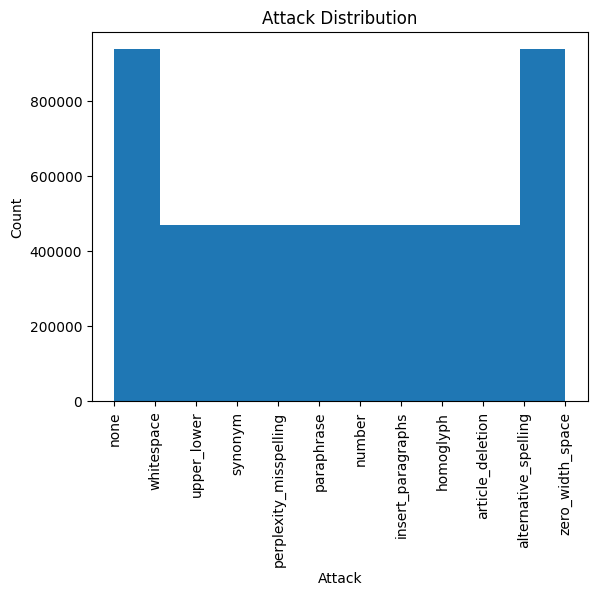

In [ ]:
plt.hist(raid_df['attack'])
plt.xlabel('Attack')
plt.ylabel('Count')
plt.title('Attack Distribution')
plt.xticks(rotation=90)
plt.show()

In [ ]:
raid_human_df = raid_df[(raid_df['model']=='human')&(raid_df['attack']=='none')][['generation', 'source']]
raid_human_df['generated'] = 0
raid_human_df.rename(columns={'generation':'text'}, inplace=True)


raid_ai_df = raid_df[(raid_df['model']!='human')&(raid_df['attack']!='none')][['generation', 'attack', 'source']]
raid_ai_df['generated'] = 1
raid_ai_df.rename(columns={'generation':'text'}, inplace=True)

# Data Exploration

In [ ]:
# Check current distribution

print(df['generated'].value_counts())

# Sample equal amounts from each class
samples_per_class = 50000

df_balanced = df.groupby('generated').apply(
    lambda x: x.sample(n=min(samples_per_class, len(x)), random_state=87)
).reset_index(drop=True)

# Shuffle
df_balanced = df_balanced.sample(frac=1, random_state=87).reset_index(drop=True)

print(df_balanced['generated'].value_counts())

generated
0.0    305797
1.0    181438
Name: count, dtype: int64
generated
0.0    50000
1.0    50000
Name: count, dtype: int64


/tmp/ipython-input-1608455631.py:8: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_balanced = df.groupby('generated').apply(


In [ ]:
# Check current distribution
print(mage_df['generated'].value_counts())

# Sample equal amounts from each class
samples_per_class = 80000

mage_df_balanced = mage_df.groupby('generated').apply(
    lambda x: x.sample(n=min(samples_per_class, len(x)), random_state=87)
).reset_index(drop=True)

# Shuffle
mage_df_balanced = mage_df_balanced.sample(frac=1, random_state=87).reset_index(drop=True)

print(mage_df_balanced['generated'].value_counts())

generated
1    225753
0     93318
Name: count, dtype: int64
generated
1    80000
0    80000
Name: count, dtype: int64


/tmp/ipython-input-2851186651.py:7: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  mage_df_balanced = mage_df.groupby('generated').apply(


In [ ]:
samples_per_attack = 9000

raid_balanced = raid_ai_df.groupby('attack').apply(
    lambda x: x.sample(n=min(samples_per_attack, len(x)), random_state=87)
).reset_index(drop=True)

print(raid_balanced['attack'].value_counts())
raid_ai_balanced = raid_balanced

attack
alternative_spelling      9000
article_deletion          9000
homoglyph                 9000
insert_paragraphs         9000
number                    9000
paraphrase                9000
perplexity_misspelling    9000
synonym                   9000
upper_lower               9000
whitespace                9000
zero_width_space          9000
Name: count, dtype: int64


/tmp/ipython-input-2927945610.py:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  raid_balanced = raid_ai_df.groupby('attack').apply(


In [ ]:
combined_df =  pd.concat([mage_df_balanced,df_balanced, mixset_full, raid_human_df, raid_ai_balanced])
counts = combined_df['generated'].value_counts()

In [ ]:
# classes are unbalanced
counts

,count
generated,
1.0,232000
0.0,143971


In [ ]:
# Human texts required
human_text_needed = counts.loc[1.0] - counts.loc[0.0]
print(human_text_needed)
mage_human_text = mage_df[mage_df['generated']==0]
mage_df_sample = pd.concat([mage_df_balanced, mage_human_text])
mage_df_sample = mage_df_sample.drop_duplicates(subset=['text'])

88029


In [ ]:
combined_df =  pd.concat([mage_df_sample,df_balanced, mixset_full, raid_human_df, raid_ai_balanced])
counts = combined_df['generated'].value_counts()

In [ ]:
# Still unbalanced
counts

,count
generated,
1.0,232000
0.0,157289


In [ ]:
# Human texts required

human_text_needed = counts.loc[1.0] - counts.loc[0.0]
print(human_text_needed)
df_human_sample = df[df['generated']==0].sample(n=human_text_needed+50000, random_state=87)
df_sample = pd.concat([df_balanced, df_human_sample])
df_sample.drop_duplicates(subset=['text'], inplace=True)


74711


In [ ]:
df_sample

,text,generated,source
0,"In the article ""Driverless Cars Are Coming"" I ...",0.0,kaggle
1,Wouldn't it be nice if we could know the perce...,0.0,kaggle
2,"Dear Principal,\n\nI am writing this letter to...",0.0,kaggle
3,"Okay, here's my essay:\n\nMaking Your Own Deci...",1.0,kaggle
4,"In today's fast paced world, many people feel ...",1.0,kaggle
...,...,...,...
269413,"When THM US Constitution was first made, THM i...",0.0,kaggle
433742,"Dead State Senator,\n\nI am in favor of keepin...",0.0,kaggle
130029,There BRE millions of wrecks in the U.S. every...,0.0,kaggle
293889,I think it would be a VVD idea TV try.\n\nIf k...,0.0,kaggle


In [ ]:
combined_df =  pd.concat([mage_df_sample,df_sample, mixset_full, raid_human_df, raid_ai_balanced])
counts = combined_df['generated'].value_counts()

In [ ]:
# Balanced classes

counts

,count
generated,
1.0,232000
0.0,232000


In [ ]:
combined_df

,text,generated,source,attack
0,"Once upon a time, there was a lost island some...",1.0,mageset,NaN
1,Bring a sweater! They keep it coooold in here....,1.0,mageset,NaN
2,There were many religions practiced during the...,1.0,mageset,NaN
3,It would have been appreciated if the guy woul...,0.0,mageset,NaN
4,"According to the tradition, Virgil traveled to...",0.0,mageset,NaN
...,...,...,...,...
98995,"""​U​-​5​7​1​""​ ​i​s​ ​a​ ​f​i​l​m​ ​t​h​a​t​ ​...",1.0,raid,zero_width_space
98996,W​h​e​n​ ​a​n​ ​e​c​c​e​n​t​r​i​c​ ​s​c​i​e​n​...,1.0,raid,zero_width_space
98997,M​y​ ​F​i​r​s​t​ ​D​a​y​ ​I​n​ ​S​c​h​o​o​l​\n...,1.0,raid,zero_width_space
98998,A​s​s​u​m​i​n​g​ ​t​h​a​t​ ​R​e​d​d​i​t​ ​i​s​...,1.0,raid,zero_width_space


In [ ]:
# Exporting final dataframe
combined_df.to_csv('data.csv')

# Data Preprocessing

In [ ]:
import pandas as pd
import os
import re
from typing import Dict, Any
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.utils import compute_class_weight
import joblib
import spacy
from imblearn.over_sampling import SMOTE

In [ ]:
CONTRACTIONS = {
    "can't": "can not", "won't": "will not", "n't": " not",
    "'re": " are", "'ve": " have", "'ll": " will", "'d": " would",
    "'m": " am"
}

In [ ]:
def expand_contractions(text: str) -> str:
    for c, e in CONTRACTIONS.items():
        text = re.sub(c, e, text, flags=re.IGNORECASE)
    return text

In [ ]:
def basic_clean(text: str) -> str:
    if not isinstance(text, str):
        return ""
    text = text.replace("\n", " ").replace("\r", " ")
    text = re.sub(r"\s+", " ", text).strip()
    text = text.lower()
    text = expand_contractions(text)
    return text

In [ ]:
def text_basic_features(text_series: pd.Series) -> pd.DataFrame:
    df = pd.DataFrame()
    df["char_count"] = text_series.apply(len)
    df["word_count"] = text_series.apply(lambda s: len(s.split()))
    df["avg_word_len"] = df["char_count"] / df["word_count"].replace(0, 1)
    df["num_sentences"] = text_series.apply(lambda s: max(1, s.count('.') + s.count('!') + s.count('?')))
    df["comma_count"] = text_series.apply(lambda s: s.count(','))
    df["exclamation_count"] = text_series.apply(lambda s: s.count('!'))
    df["question_count"] = text_series.apply(lambda s: s.count('?'))
    df["unique_word_count"] = text_series.apply(lambda s: len(set(s.split())))
    df["type_token_ratio"] = df["unique_word_count"] / df["word_count"].replace(0, 1)
    return df

In [ ]:
def preprocess_dataset(
    csv_path: str,
    text_col: str = "text",
    label_col: str = "generated",
    test_size: float = 0.10,
    val_size: float = 0.10,
    random_state: int = 42,
    tfidf_max_features: int = 20000,
    tfidf_ngram_range: tuple = (1, 2),
    count_max_features: int = 10000
) -> Dict[str, Any]:

    df = pd.read_csv(csv_path)
    print(f"Loaded {len(df)} rows from {csv_path}")
    df["source"] = df["source"].fillna("raid")

    before = len(df)
    df = df.dropna(subset=[label_col]).reset_index(drop=True)
    print(f"Dropped {before - len(df)} rows with missing labels")

    df[label_col] = df[label_col].astype(int)
    if not set(df[label_col].unique()).issubset({0, 1}):
        raise ValueError("Labels must be 0 (human) or 1 (ai)")

    df["text_raw"] = df[text_col].fillna("").astype(str)

    df["text_clean"] = df["text_raw"].apply(basic_clean)

    nlp = spacy.load("en_core_web_sm", disable=["ner", "parser"])
    def lemmatize_text(s: str) -> str:
        doc = nlp(s)
        return " ".join([token.lemma_ for token in doc if not token.is_space])
    print("Running spaCy lemmatization (may be slow)...")
    df["text_clean"] = df["text_clean"].apply(lemmatize_text)

    n_dupes = df.duplicated(subset=["text_clean"]).sum()
    if n_dupes > 0:
        print(f"Removing {n_dupes} duplicate texts")
        df = df.drop_duplicates(subset=["text_clean"]).reset_index(drop=True)

    print("Label counts:", df[label_col].value_counts().to_dict())

    numeric_feats = text_basic_features(df["text_clean"])
    print("Computed numeric text features")

    df_trainval, df_test, feats_trainval, feats_test = train_test_split(
        df, numeric_feats, test_size=test_size, stratify=df[label_col], random_state=random_state
    )

    val_rel = val_size / (1.0 - test_size)

    df_train, df_val, feats_train, feats_val = train_test_split(
        df_trainval, feats_trainval, test_size=val_rel, stratify=df_trainval[label_col], random_state=random_state
    )

    print(f"Split sizes -> train: {len(df_train)}, val: {len(df_val)}, test: {len(df_test)}")

    tfidf = TfidfVectorizer(
        max_features=tfidf_max_features,
        ngram_range=tfidf_ngram_range,
        strip_accents="unicode",
        lowercase=True,
        norm="l2"
    )

    tfidf_train = tfidf.fit_transform(df_train["text_clean"])
    tfidf_val = tfidf.transform(df_val["text_clean"])
    tfidf_test = tfidf.transform(df_test["text_clean"])
    print(f"TF-IDF shapes -> train: {tfidf_train.shape}, val: {tfidf_val.shape}, test: {tfidf_test.shape}")

    count_vec = CountVectorizer(max_features=count_max_features, ngram_range=(1, 2))

    count_train = count_vec.fit_transform(df_train["text_clean"])
    count_val = count_vec.transform(df_val["text_clean"])
    count_test = count_vec.transform(df_test["text_clean"])
    print(f"CountVectorizer shapes -> train: {count_train.shape}")

    scaler = StandardScaler(with_mean=False)  # sparse compatible
    scaler.fit(feats_train)

    feats_train_s = scaler.transform(feats_train)
    feats_val_s = scaler.transform(feats_val)
    feats_test_s = scaler.transform(feats_test)

    y_train = df_train[label_col].values
    class_weights = compute_class_weight(class_weight="balanced", classes=np.unique(y_train), y=y_train)
    class_weight_dict = {int(cls): float(w) for cls, w in zip(np.unique(y_train), class_weights)}
    print("Suggested class_weight:", class_weight_dict)

    return {
        "df": df,
        "df_train": df_train,
        "df_val": df_val,
        "df_test": df_test,
        "tfidf": tfidf,
        "count_vec": count_vec,
        "scaler": scaler,
        "class_weight": class_weight_dict,
        "features": {
            "tfidf_train": tfidf_train,
            "tfidf_val": tfidf_val,
            "tfidf_test": tfidf_test,
            "count_train": count_train,
            "count_val": count_val,
            "count_test": count_test,
            "feats_train": feats_train_s,
            "feats_val": feats_val_s,
            "feats_test": feats_test_s,
        }
    }

In [ ]:
CSV_PATH = "data/data.csv"
artifacts = preprocess_dataset(
    CSV_PATH,
    text_col="text",
    label_col="generated",
    test_size=0.10,
    val_size=0.10,
    random_state=42,          
    tfidf_max_features=20000,
    tfidf_ngram_range=(1, 2),
    count_max_features=10000
)


print("Preprocessing finished. Artifacts ready for model training.")

Loaded 464000 rows from data/data.csv
Dropped 0 rows with missing labels
Removing 33588 duplicate texts
Label counts: {0: 228022, 1: 202390}
Computed numeric text features
Split sizes -> train: 344328, val: 43042, test: 43042
TF-IDF shapes -> train: (344328, 20000), val: (43042, 20000), test: (43042, 20000)
CountVectorizer shapes -> train: (344328, 10000)
Suggested class_weight: {0: 0.9437987895798614, 1: 1.0633183457680715}
Preprocessing finished. Artifacts ready for model training.


# Model Development

### Logistic Regression

In [ ]:
from typing import Dict, Any
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from sklearn.metrics import classification_report, accuracy_score, f1_score, make_scorer
from scipy.sparse import hstack
import numpy as np

def train_logreg_model(
    outputs: Dict[str, Any],
    use_randomized_search: bool = False,
    C: float = 0.01,
    penalty: str = "l2",
    solver: str = "saga",
    max_iter: int = 100,
    class_weight: dict = None,
    random_state: int = 42,
    verbose: int = 2,
    param_distributions: Dict[str, Any] = None,
    n_iter: int = 20,
    cv_folds: int = 3,
    scoring = None, 
    n_jobs: int = -1
):
    df_train = outputs["df_train"]
    df_val   = outputs["df_val"]
    df_test  = outputs["df_test"]

    print("Original class distribution in training set:")
    print(df_train['generated'].value_counts())

    samples_per_class = 150000
    df_balanced = (
        df_train.groupby("generated")
        .apply(lambda g: g.sample(n=min(samples_per_class, len(g)), random_state=random_state))
        .reset_index(drop=True)
    )
    df_balanced = df_balanced.sample(frac=1, random_state=random_state).reset_index(drop=True)
    print("\nBalanced class distribution:")
    print(df_balanced['generated'].value_counts())

    tfidf_train = outputs["tfidf"]["train"]
    tfidf_val   = outputs["tfidf"]["val"]
    tfidf_test  = outputs["tfidf"]["test"]

    count_train = outputs["count"]["train"]
    count_val   = outputs["count"]["val"]
    count_test  = outputs["count"]["test"]

    feats_train = outputs["feats_scaled"]["train"]
    feats_val   = outputs["feats_scaled"]["val"]
    feats_test  = outputs["feats_scaled"]["test"]

    y_train = outputs["y_train"]
    y_val   = outputs["y_val"]
    y_test  = outputs["y_test"]

    if class_weight is None:
        class_weight = outputs.get("class_weight", None)

    X_train = hstack([tfidf_train, count_train, feats_train])
    X_val   = hstack([tfidf_val,   count_val,   feats_val])
    X_test  = hstack([tfidf_test,  count_test,  feats_test])

    print("\nFinal feature shapes:")
    print("Train:", X_train.shape)
    print("Val:  ", X_val.shape)
    print("Test: ", X_test.shape)

    base_params = {
        "C": C,
        "penalty": penalty,
        "solver": solver,
        "max_iter": max_iter,
        "class_weight": class_weight,
        "random_state": random_state
    }

    if param_distributions is None:
        param_distributions = {
            "C": [0.01, 0.1, 1.0],
            "penalty": ["l2"],
            "solver": ["liblinear", "saga"],
            "max_iter": [100, 200, 500]
        }

    if scoring is None:
        scoring = make_scorer(f1_score)

    search_obj = None

    if use_randomized_search:
        print("\nPerforming RandomizedSearchCV for Logistic Regression...")
        init_params = {k: v for k, v in base_params.items() if k not in param_distributions}
        model_init = LogisticRegression(**init_params)

        cv = StratifiedKFold(n_splits=cv_folds, shuffle=True, random_state=random_state)

        search = RandomizedSearchCV(
            estimator=model_init,
            param_distributions=param_distributions,
            n_iter=n_iter,
            scoring=scoring,
            cv=cv,
            random_state=random_state,
            n_jobs=n_jobs,
            verbose=verbose,
            return_train_score=False
        )

        search.fit(X_train, y_train)
        best_model = search.best_estimator_
        print(f"\nRandomizedSearchCV best params: {search.best_params_}")
        print(f"Best CV (validation) score (scoring='{scoring}'): {search.best_score_:.4f}")
        search_obj = search
    else:
        print("\nTraining Logistic Regression with provided hyperparameters...")
        best_model = LogisticRegression(**base_params)
        best_model.fit(X_train, y_train)

    print("\nValidation Results:")
    val_pred = best_model.predict(X_val)
    print(classification_report(y_val, val_pred, digits=4))
    print("Val Accuracy:", accuracy_score(y_val, val_pred))
    print("Val F1:", f1_score(y_val, val_pred))

    return best_model, search_obj


In [ ]:
# Training before hyperparameter tuning
logreg_model = train_logreg_model(artifacts)

Original class distribution in training set:
generated
0    182417
1    161911
Name: count, dtype: int64

Balanced class distribution:
generated
0    150000
1    150000
Name: count, dtype: int64


/var/folders/4_/4jj2bskn0rq35v92whxd37840000gn/T/ipykernel_92870/1817033467.py:28: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.sample(n=min(samples_per_class, len(g)), random_state=random_state))



Final feature shapes:
Train: (344328, 30009)
Val:   (43041, 30009)
Test:  (43042, 30009)

Training Logistic Regression with provided hyperparameters...


/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(



Validation Results:
              precision    recall  f1-score   support

           0     0.8855    0.8002    0.8407     22802
           1     0.7969    0.8834    0.8379     20239

    accuracy                         0.8393     43041
   macro avg     0.8412    0.8418    0.8393     43041
weighted avg     0.8438    0.8393    0.8394     43041

Val Accuracy: 0.8393160010222811
Val F1: 0.83793410507569


In [ ]:
# Training after hyperparameter tuning
logreg_model_tuned = train_logreg_model(artifacts, solver = "liblinear", max_iter = 500, C = 0.5)

Original class distribution in training set:
generated
0    182417
1    161911
Name: count, dtype: int64


/var/folders/4_/4jj2bskn0rq35v92whxd37840000gn/T/ipykernel_8317/571957894.py:47: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.sample(n=min(samples_per_class, len(g)), random_state=random_state))



Balanced class distribution:
generated
0    150000
1    150000
Name: count, dtype: int64

Final feature shapes:
Train: (344328, 30009)
Val:   (43041, 30009)
Test:  (43042, 30009)

Training Logistic Regression with provided hyperparameters...


/opt/anaconda3/lib/python3.12/site-packages/sklearn/svm/_base.py:1250: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(



Validation Results:
              precision    recall  f1-score   support

           0     0.9056    0.8815    0.8934     22802
           1     0.8703    0.8965    0.8832     20239

    accuracy                         0.8885     43041
   macro avg     0.8880    0.8890    0.8883     43041
weighted avg     0.8890    0.8885    0.8886     43041

Val Accuracy: 0.8885481285286122
Val F1: 0.8832477425949814


### Random Forest

##### Preparing artifacts

In [ ]:
df = artifacts["df"]
df_train = artifacts["df_train"]
df_val = artifacts["df_val"]
df_test = artifacts["df_test"]

In [ ]:
df

,Unnamed: 0,text,generated,source,text_raw,text_clean
0,0,"Once upon a time, there was a lost island some...",1,mageset,"Once upon a time, there was a lost island some...","once upon a time, there was a lost island some..."
1,1,Bring a sweater! They keep it coooold in here....,1,mageset,Bring a sweater! They keep it coooold in here....,bring a sweater! they keep it coooold in here....
2,2,There were many religions practiced during the...,1,mageset,There were many religions practiced during the...,there were many religions practiced during the...
3,3,It would have been appreciated if the guy woul...,0,mageset,It would have been appreciated if the guy woul...,it would have been appreciated if the guy woul...
4,4,"According to the tradition, Virgil traveled to...",0,mageset,"According to the tradition, Virgil traveled to...","according to the tradition, virgil traveled to..."
...,...,...,...,...,...,...
430407,98995,"""​U​-​5​7​1​""​ ​i​s​ ​a​ ​f​i​l​m​ ​t​h​a​t​ ​...",1,raid,"""​U​-​5​7​1​""​ ​i​s​ ​a​ ​f​i​l​m​ ​t​h​a​t​ ​...","""​u​-​5​7​1​""​ ​i​s​ ​a​ ​f​i​l​m​ ​t​h​a​t​ ​..."
430408,98996,W​h​e​n​ ​a​n​ ​e​c​c​e​n​t​r​i​c​ ​s​c​i​e​n​...,1,raid,W​h​e​n​ ​a​n​ ​e​c​c​e​n​t​r​i​c​ ​s​c​i​e​n​...,w​h​e​n​ ​a​n​ ​e​c​c​e​n​t​r​i​c​ ​s​c​i​e​n​...
430409,98997,M​y​ ​F​i​r​s​t​ ​D​a​y​ ​I​n​ ​S​c​h​o​o​l​\n...,1,raid,M​y​ ​F​i​r​s​t​ ​D​a​y​ ​I​n​ ​S​c​h​o​o​l​\n...,m​y​ ​f​i​r​s​t​ ​d​a​y​ ​i​n​ ​s​c​h​o​o​l​ ​...
430410,98998,A​s​s​u​m​i​n​g​ ​t​h​a​t​ ​R​e​d​d​i​t​ ​i​s​...,1,raid,A​s​s​u​m​i​n​g​ ​t​h​a​t​ ​R​e​d​d​i​t​ ​i​s​...,a​s​s​u​m​i​n​g​ ​t​h​a​t​ ​r​e​d​d​i​t​ ​i​s​...


In [ ]:
len(df)

430412

In [ ]:
df['generated'].map({0: 'Human', 1: 'AI'}).value_counts()

generated
Human    228022
AI       202390
Name: count, dtype: int64

In [ ]:
df['text'].duplicated().sum()

np.int64(0)

In [ ]:
df.isna().sum()

Unnamed: 0    0
text          0
generated     0
source        0
text_raw      0
text_clean    0
dtype: int64

In [ ]:
df["source"].isna().sum()

np.int64(0)

In [ ]:
df

,Unnamed: 0,text,generated,source,text_raw,text_clean
0,0,"Once upon a time, there was a lost island some...",1,mageset,"Once upon a time, there was a lost island some...","once upon a time, there was a lost island some..."
1,1,Bring a sweater! They keep it coooold in here....,1,mageset,Bring a sweater! They keep it coooold in here....,bring a sweater! they keep it coooold in here....
2,2,There were many religions practiced during the...,1,mageset,There were many religions practiced during the...,there were many religions practiced during the...
3,3,It would have been appreciated if the guy woul...,0,mageset,It would have been appreciated if the guy woul...,it would have been appreciated if the guy woul...
4,4,"According to the tradition, Virgil traveled to...",0,mageset,"According to the tradition, Virgil traveled to...","according to the tradition, virgil traveled to..."
...,...,...,...,...,...,...
430407,98995,"""​U​-​5​7​1​""​ ​i​s​ ​a​ ​f​i​l​m​ ​t​h​a​t​ ​...",1,raid,"""​U​-​5​7​1​""​ ​i​s​ ​a​ ​f​i​l​m​ ​t​h​a​t​ ​...","""​u​-​5​7​1​""​ ​i​s​ ​a​ ​f​i​l​m​ ​t​h​a​t​ ​..."
430408,98996,W​h​e​n​ ​a​n​ ​e​c​c​e​n​t​r​i​c​ ​s​c​i​e​n​...,1,raid,W​h​e​n​ ​a​n​ ​e​c​c​e​n​t​r​i​c​ ​s​c​i​e​n​...,w​h​e​n​ ​a​n​ ​e​c​c​e​n​t​r​i​c​ ​s​c​i​e​n​...
430409,98997,M​y​ ​F​i​r​s​t​ ​D​a​y​ ​I​n​ ​S​c​h​o​o​l​\n...,1,raid,M​y​ ​F​i​r​s​t​ ​D​a​y​ ​I​n​ ​S​c​h​o​o​l​\n...,m​y​ ​f​i​r​s​t​ ​d​a​y​ ​i​n​ ​s​c​h​o​o​l​ ​...
430410,98998,A​s​s​u​m​i​n​g​ ​t​h​a​t​ ​R​e​d​d​i​t​ ​i​s​...,1,raid,A​s​s​u​m​i​n​g​ ​t​h​a​t​ ​R​e​d​d​i​t​ ​i​s​...,a​s​s​u​m​i​n​g​ ​t​h​a​t​ ​r​e​d​d​i​t​ ​i​s​...


In [ ]:
from scipy.sparse import hstack

tfidf_train = artifacts["features"]["tfidf_train"]
tfidf_val = artifacts["features"]["tfidf_val"]
tfidf_test = artifacts["features"]["tfidf_test"]

feats_train = artifacts["features"]["feats_train"]
feats_val = artifacts["features"]["feats_val"]
feats_test = artifacts["features"]["feats_test"]

y_train = df_train["generated"].values
y_val = df_val["generated"].values
y_test = df_test["generated"].values


In [ ]:
X_train = hstack([tfidf_train, feats_train])
X_val = hstack([tfidf_val, feats_val])
X_test = hstack([tfidf_test, feats_test])

##### Hyper Parameter Tuning

In [ ]:
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingRandomSearchCV
from sklearn.ensemble import RandomForestClassifier
from scipy.stats import randint

param_dist = {
    "n_estimators": randint(100, 400),
    "max_depth": [None] + list(range(10, 60, 10)),
    "min_samples_split": randint(2, 10),
    "min_samples_leaf": randint(1, 5),
    "max_features": ["sqrt", "log2"],
    "bootstrap": [True, False]
}

rf_base = RandomForestClassifier(
    random_state=42,
    n_jobs=-1,
    class_weight=artifacts["class_weight"]
)

search = HalvingRandomSearchCV(
    estimator=rf_base,
    param_distributions=param_dist,
    factor=3,
    scoring="f1_macro",
    cv=2,
    random_state=42,
    n_jobs=-1,
    verbose=2
)

search.fit(X_train, y_train)

print("Best params:", search.best_params_)
rf = search.best_estimator_

n_iterations: 10
n_required_iterations: 10
n_possible_iterations: 10
min_resources_: 8
max_resources_: 344328
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 43041
n_resources: 8
Fitting 2 folds for each of 43041 candidates, totalling 86082 fits
[CV] END bootstrap=False, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=121; total time=   0.1s
[CV] END bootstrap=False, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=121; total time=   0.1s
[CV] END bootstrap=True, max_depth=30, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=171; total time=   0.2s
[CV] END bootstrap=True, max_depth=30, max_features=sqrt, min_samples_leaf=3, min_samples_split=4, n_estimators=171; total time=   0.2s
[CV] END bootstrap=True, max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5, n_estimators=251; total time=   0.2s
[CV] END bootstrap=True, max_depth=20, max_feat

##### Using best hyper parameters for the model

In [ ]:
rf = RandomForestClassifier(
    bootstrap= False,
    n_estimators=358,
    max_depth=None,
    max_features= 'sqrt',
    min_samples_leaf=1,
    min_samples_split=3,
    random_state=42,
    class_weight=artifacts["class_weight"]
)

rf.fit(X_train, y_train)

,n_estimators,358
,criterion,'gini'
,max_depth,None
,min_samples_split,3
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,False
,oob_score,False


In [ ]:
from sklearn.metrics import classification_report, accuracy_score

pred_val = rf.predict(X_val)
pred_test = rf.predict(X_test)

print("Validation Metrics:")
print(classification_report(y_val, pred_val))

print("\nTest Metrics:")
print(classification_report(y_test, pred_test))


Validation Metrics:
              precision    recall  f1-score   support

           0       0.92      0.92      0.92     22803
           1       0.91      0.91      0.91     20239

    accuracy                           0.91     43042
   macro avg       0.91      0.91      0.91     43042
weighted avg       0.91      0.91      0.91     43042


Test Metrics:
              precision    recall  f1-score   support

           0       0.92      0.92      0.92     22803
           1       0.91      0.91      0.91     20239

    accuracy                           0.92     43042
   macro avg       0.92      0.92      0.92     43042
weighted avg       0.92      0.92      0.92     43042



In [ ]:
import pickle

filename = 'trained_model_latest.pkl'

with open(filename, 'wb') as file:
    pickle.dump(rf, file)

In [ ]:
def predict_texts(text_list, artifacts, model):
    tfidf = artifacts["tfidf"]
    count_vec = artifacts["count_vec"]
    scaler = artifacts["scaler"]

    cleaned = [basic_clean(t) for t in text_list]

    nums = text_basic_features(pd.Series(cleaned))
    nums_scaled = scaler.transform(nums)

    tfidf_feats = tfidf.transform(cleaned)

    from scipy.sparse import hstack
    X = hstack([tfidf_feats, nums_scaled])

    preds = model.predict(X)
    probs = model.predict_proba(X)[:, 1]

    mapped = ["AI" if p == 1 else "Human" for p in preds]
    return mapped, probs


##### Model Testing

In [ ]:
samples = [
    "Valve artist responds to Epic Games CEO Tim Sweeney and more calling on Steam to drop the 'Made with AI' label: \"This is like saying food products shouldn't have their ingredients list... The only people afraid of this are the ones that know their product is low effort\"",

    "The rapid advancement of modern technology continues to reshape the way individuals interact with information, creating a dynamic environment where efficiency and accessibility are prioritized above all else. As organizations explore new opportunities for optimization, there is an increasing emphasis on integrating intelligent automated systems capable of analyzing patterns, generating insights, and supporting decision-making processes. This shift not only enhances productivity but also opens pathways for innovative solutions that adapt to evolving user needs in a highly interconnected digital ecosystem.",

    "Technology is changing fast, and it's completely transforming how we find and use information. Speed and ease of access have become the name of the game. Companies are jumping on this by bringing in smart automated tools that can spot patterns, pull out useful insights, and help people make better decisions. The result? People get more done, and there's room for creative solutions that can actually grow and change alongside what users need—all in a world that's more connected than ever.",

    "THE Conventions of a number of the States, having at the time of their adopting the Constitution, expressed a desire, in order to prevent misconstruction or abuse of its powers, that further declaratory and restrictive clauses should be added: And as extending the ground of public confidence in the Government, will best ensure the beneficent ends of its institution RESOLVED by the Senate and House of Representatives of the United States of America, in Congress assembled, two thirds of both Houses concurring, that the following Articles be proposed to the Legislatures of the several States, as amendments to the Constitution of the United States, all, or any of which Articles, when ratified by three fourths of the said Legislatures, to be valid to all intents and purposes, as part of the said Constitution; viz.",

    "When several states signed on to the Constitution, they made one thing clear: they wanted extra protections added to prevent the government from overstepping or misusing its power. They believed that spelling out these limits would help the public trust the new government and keep it focused on serving the people. So Congress took action. The Senate and the House of Representatives, with two-thirds of both chambers in agreement, proposed the following amendments to the Constitution. Once three-fourths of the state legislatures approve any of these articles, they officially become part of the Constitution."
]

preds, probs = predict_texts(samples, artifacts, rf)

for i, (p, pr) in enumerate(zip(preds, probs), start=1):
    print(f"{i}. Prediction: {p}, AI probability: {pr:.4f}")


1. Prediction: Human, AI probability: 0.4553
2. Prediction: AI, AI probability: 0.7591
3. Prediction: AI, AI probability: 0.6481
4. Prediction: Human, AI probability: 0.3656
5. Prediction: Human, AI probability: 0.3712


### BERT model

In [ ]:
from transformers import  BertForSequenceClassification
import torch
from sklearn.model_selection import train_test_split
import pandas as pd
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
from tqdm import tqdm
from transformers import AutoTokenizer
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

In [ ]:
train_df, test_df = train_test_split(df, test_size=0.1, stratify=df['generated'], random_state=101)
train_df, valid_df = train_test_split(train_df, test_size=0.1, stratify=train_df['generated'], random_state=101)

#### Tokenizer

In [ ]:
tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")

def tokenize_batch(sampled_df_text):
  batch_size = 1024
  all_input_ids = []
  all_attention_mask = []

  for i in range(0, len(sampled_df_text.values), batch_size):
      batch_texts = sampled_df_text.values[i:i+batch_size].tolist()
      encoded = tokenizer(
          batch_texts,
          padding='max_length',
          truncation=True,
          max_length=256,
          return_tensors="pt"
      )

      all_input_ids.append(encoded["input_ids"])
      all_attention_mask.append(encoded["attention_mask"])

  input_ids = torch.cat(all_input_ids, dim=0)
  attention_mask = torch.cat(all_attention_mask, dim=0)
  return input_ids, attention_mask


#### AI Text Detector BERT Model

In [ ]:
class BERTModel(torch.nn.Module):

  def __init__(self):
    super().__init__()
    self.bert_model = BertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=2)

  def forward(self, input_ids, attention_mask):
    out =  self.bert_model(input_ids=input_ids, attention_mask=attention_mask)
    return out.logits


#### Trainer

In [ ]:
def train_model(model, train_dataset, validation_dataset,
                optimizer=None, scheduler=None,
                start_epoch=0, epochs=8,
                best_accuracy=None,
                start_lr=2e-5,finetune_stage=1,
                device=None):



    train_loader = DataLoader(train_dataset, batch_size=512,
                              shuffle=True, pin_memory=True, num_workers=2)
    validation_loader  = DataLoader(validation_dataset, batch_size=512,
                              pin_memory=True, num_workers=2)

    model = model.to(device)

    if optimizer is None:
        optimizer = torch.optim.AdamW(model.parameters(), lr=start_lr, weight_decay=1e-5)

    if scheduler is None:
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode='max', factor=0.5, patience=3
        )

    criterion = torch.nn.CrossEntropyLoss()

    if best_accuracy is None:
        best_accuracy = 0.0

    patience = 4
    patience_counter = 0
    best_model_state = None

    for ep in range(start_epoch, epochs):
        model.train()
        train_epoch_loss = 0.0
        validation_epoch_loss = 0.0

        # Training loop
        batch_train_predictions = []
        batch_train_truths = []
        tqdm_loader = tqdm(train_loader, desc=f" Training Epoch {ep}")
        for batch_input_ids, batch_attention_masks, batch_labels in tqdm_loader:
          batch_input_ids = batch_input_ids.to(device)
          batch_attention_masks = batch_attention_masks.to(device)
          batch_labels = batch_labels.to(device)

          optimizer.zero_grad()
          y_preds = model(batch_input_ids, batch_attention_masks)
          predictions = torch.argmax(y_preds, dim=1)
          batch_train_predictions.append(predictions)
          batch_train_truths.append(batch_labels)
          loss = criterion(y_preds, batch_labels)
          loss.backward()
          torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
          optimizer.step()

          train_epoch_loss += loss.item() * batch_input_ids.size(0)
        y_pred_all = torch.cat(batch_train_predictions)
        y_true_all = torch.cat(batch_train_truths)
        train_accuracy = (y_pred_all == y_true_all).float().mean().item()
        train_epoch_loss /= len(train_loader.dataset)

    
        # Validation loop
        model.eval()
        batch_validation_predictions = []
        batch_validation_truths = []

        with torch.no_grad():
            tqdm_loader = tqdm(validation_loader, desc=f" Validation Epoch {ep}")
            for batch_input_ids, batch_attention_masks, batch_labels in tqdm_loader:
                batch_input_ids = batch_input_ids.to(device)
                batch_attention_masks = batch_attention_masks.to(device)
                batch_labels = batch_labels.to(device)

                y_preds = model(batch_input_ids, batch_attention_masks)
                predictions = torch.argmax(y_preds, dim=1)

                batch_validation_predictions.append(predictions)
                batch_validation_truths.append(batch_labels)

                loss = criterion(y_preds, batch_labels)
                validation_epoch_loss += loss.item() * batch_input_ids.size(0)
        # concatenate both lists so they match
        y_pred_all = torch.cat(batch_validation_predictions)
        y_true_all = torch.cat(batch_validation_truths)

        validation_accuracy = (y_pred_all == y_true_all).float().mean().item()
        validation_epoch_loss /= len(validation_loader.dataset)

        scheduler.step(validation_accuracy)

        print(f"Epoch {ep}: Train Loss={train_epoch_loss:.4f} : "
              f"Validation Loss={validation_epoch_loss:.4f} : Best acc={best_accuracy:.4f} : "
              f"LR={optimizer.param_groups[0]['lr']:.6f} : Train Accuracy={train_accuracy:.4f} : Validation Accuracy={validation_accuracy:.4f}")
        
        # Early stopping
        if validation_accuracy > best_accuracy + 1e-4:
            best_accuracy = validation_accuracy
            patience_counter = 0
            best_model_state = model.state_dict()
        else:
            patience_counter += 1
            if patience_counter == patience:
                if best_model_state is not None:
                    print("Loaded best model")
                    model.load_state_dict(best_model_state)
                print(f"Converged at Epoch {ep} with Acc={best_accuracy:.4f}")
                break

        # Save checkpoint


        ckpt_path = f"/content/drive/MyDrive/finetune_stage{finetune_stage}_checkpoint_epoch_{ep}.pth"
        torch.save({
            "model": best_model_state if best_model_state is not None else model.state_dict(),
            "optimizer": optimizer.state_dict(),
            "scheduler": scheduler.state_dict(),
            "epoch": ep,
            "best_accuracy": best_accuracy
        }, ckpt_path)
        print(f"Checkpoint saved: {ckpt_path}")



    return model, optimizer, scheduler


#### Sampling for finetuning

In [ ]:
# Check current distribution
print(train_df['generated'].value_counts())

# Sample equal amounts from each class
samples_per_class = 100000

train_df_balanced = train_df.groupby('generated').apply(
    lambda x: x.sample(n=min(samples_per_class, len(x)), random_state=101)
).reset_index(drop=True)

# Shuffle
train_df_balanced = train_df_balanced.sample(frac=1, random_state=101).reset_index(drop=True)

print(train_df_balanced['generated'].value_counts())

generated
0.0    187920
1.0    187920
Name: count, dtype: int64
generated
0.0    100000
1.0    100000
Name: count, dtype: int64


/tmp/ipython-input-76668706.py:7: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  train_df_balanced = train_df.groupby('generated').apply(


#### Tokenize and prepare inputs and true outputs

In [ ]:
train_input_ids, train_attention_masks = tokenize_batch(train_df_balanced["text"])
validation_input_ids, validation_attention_masks = tokenize_batch(valid_df["text"])
y_train = torch.LongTensor(train_df_balanced['generated'].values.astype(np.long))
y_val = torch.LongTensor(valid_df['generated'].values.astype(np.long))

#### Create a Tensor dataset for train and validation

In [ ]:
train_dataset = TensorDataset(train_input_ids, train_attention_masks, y_train)
validation_dataset  = TensorDataset(validation_input_ids, validation_attention_masks, y_val)

#### Initalize Model

In [ ]:
model = BERTModel()

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
model

BERTModel(
  (bert_model): BertForSequenceClassification(
    (bert): BertModel(
      (embeddings): BertEmbeddings(
        (word_embeddings): Embedding(30522, 768, padding_idx=0)
        (position_embeddings): Embedding(512, 768)
        (token_type_embeddings): Embedding(2, 768)
        (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
        (dropout): Dropout(p=0.1, inplace=False)
      )
      (encoder): BertEncoder(
        (layer): ModuleList(
          (0-11): 12 x BertLayer(
            (attention): BertAttention(
              (self): BertSdpaSelfAttention(
                (query): Linear(in_features=768, out_features=768, bias=True)
                (key): Linear(in_features=768, out_features=768, bias=True)
                (value): Linear(in_features=768, out_features=768, bias=True)
                (dropout): Dropout(p=0.1, inplace=False)
              )
              (output): BertSelfOutput(
                (dense): Linear(in_features=768, out_features=

#### Define Optimizer for finetuning

In [ ]:
optimizer = torch.optim.AdamW([
    # Layer 11 (except output) - 1e-5
    {
        'params': model.bert_model.bert.encoder.layer[8].parameters(),
        'lr': 3e-6,
        'weight_decay': 1e-5
    },
     {
        'params': model.bert_model.bert.encoder.layer[9].parameters(),
        'lr': 3e-6,
        'weight_decay': 1e-5
    },
    {
        'params': model.bert_model.bert.encoder.layer[10].parameters(),
        'lr': 5e-6,
        'weight_decay': 1e-5
    },
    {
        'params': model.bert_model.bert.encoder.layer[11].attention.parameters(),
        'lr': 1e-5,
        'weight_decay': 1e-5
    },
    {
        'params': model.bert_model.bert.encoder.layer[11].intermediate.parameters(),
        'lr': 1e-5,
        'weight_decay': 1e-5
    },
    # Layer 11 output - 2e-5
    {
        'params': model.bert_model.bert.encoder.layer[11].output.parameters(),
        'lr': 2e-5,
        'weight_decay': 1e-5
    },
    # Pooler - 2e-5
    {
        'params': model.bert_model.bert.pooler.parameters(),
        'lr': 2e-5,
        'weight_decay': 1e-5
    },
    # Classifier - 2e-5
    {
        'params': model.bert_model.classifier.parameters(),
        'lr': 4e-5,
        'weight_decay': 1e-5
    }
])

#### Freeze layers for finetuning

In [ ]:
for p in model.parameters():
  p.requires_grad = False
for p in model.bert_model.bert.encoder.layer[8].parameters():
  p.requires_grad = True
for p in model.bert_model.bert.encoder.layer[9].parameters():
  p.requires_grad = True
for p in model.bert_model.bert.encoder.layer[10].parameters():
  p.requires_grad = True
for p in model.bert_model.bert.encoder.layer[11].parameters():
  p.requires_grad = True
for p in model.bert_model.bert.pooler.parameters():
  p.requires_grad = True
for p in model.bert_model.classifier.parameters():
  p.requires_grad = True

##### Finetune - 1: Stopping at Epoch 7

In [ ]:
model, optimizer, scheduler = train_model(model, train_dataset, validation_dataset,
                optimizer=optimizer, scheduler=None,
                start_epoch=0, epochs=8,
                best_accuracy=None,
                start_lr=3e-5,
                device=torch.device("cuda"))

Epoch 0: Train Loss=0.3503 : Validation Loss=0.2808 : Best acc=0.0000 : LR=0.000003 : Train Accuracy=0.8330 : Validation Accuracy=0.8709
Checkpoint saved: /content/drive/MyDrive/finetune_stage1_checkpoint_epoch_0.pth
Epoch 1: Train Loss=0.2268 : Validation Loss=0.2469 : Best acc=0.8709 : LR=0.000003 : Train Accuracy=0.8989 : Validation Accuracy=0.8911
Checkpoint saved: /content/drive/MyDrive/finetune_stage1_checkpoint_epoch_1.pth
Epoch 2: Train Loss=0.1915 : Validation Loss=0.2626 : Best acc=0.8911 : LR=0.000003 : Train Accuracy=0.9168 : Validation Accuracy=0.8901
Checkpoint saved: /content/drive/MyDrive/finetune_stage1_checkpoint_epoch_2.pth
Epoch 3: Train Loss=0.1695 : Validation Loss=0.2726 : Best acc=0.8911 : LR=0.000003 : Train Accuracy=0.9277 : Validation Accuracy=0.8904
Checkpoint saved: /content/drive/MyDrive/finetune_stage1_checkpoint_epoch_3.pth
Epoch 4: Train Loss=0.1529 : Validation Loss=0.2299 : Best acc=0.8911 : LR=0.000003 : Train Accuracy=0.9356 : Validation Accuracy=0.

#### Load saved best model

In [ ]:
states = torch.load("/content/drive/MyDrive/finetune_stage1_checkpoint_epoch_7.pth",
                    map_location="cuda")

device = torch.device("cuda")

# Load model weights
model.load_state_dict(states["model"])

# Create optimizer AFTER model is on CUDA
optimizer = torch.optim.AdamW([
    # Layer 11 (except output) - 1e-5
    {
        'params': model.bert_model.bert.encoder.layer[8].parameters(),
        'lr': 3e-6,
        'weight_decay': 1e-5
    },
     {
        'params': model.bert_model.bert.encoder.layer[9].parameters(),
        'lr': 3e-6,
        'weight_decay': 1e-5
    },
    {
        'params': model.bert_model.bert.encoder.layer[10].parameters(),
        'lr': 5e-6,
        'weight_decay': 1e-5
    },
    {
        'params': model.bert_model.bert.encoder.layer[11].attention.parameters(),
        'lr': 1e-5,
        'weight_decay': 1e-5
    },
    {
        'params': model.bert_model.bert.encoder.layer[11].intermediate.parameters(),
        'lr': 1e-5,
        'weight_decay': 1e-5
    },
    # Layer 11 output - 2e-5
    {
        'params': model.bert_model.bert.encoder.layer[11].output.parameters(),
        'lr': 2e-5,
        'weight_decay': 1e-5
    },
    # Pooler - 2e-5
    {
        'params': model.bert_model.bert.pooler.parameters(),
        'lr': 2e-5,
        'weight_decay': 1e-5
    },
    # Classifier - 2e-5
    {
        'params': model.bert_model.classifier.parameters(),
        'lr': 4e-5,
        'weight_decay': 1e-5
    }
])

# Load optimizer state
optimizer.load_state_dict(states["optimizer"])

# Move optimizer state to CUDA
for state in optimizer.state.values():
    for k, v in state.items():
        if torch.is_tensor(v):
            state[k] = v.to(device)

# Create scheduler
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            optimizer, mode='max', factor=0.5, patience=3
        )

# Load scheduler state
scheduler.load_state_dict(states["scheduler"])

start_epoch = states["epoch"] + 1
best_accuracy = states["best_accuracy"]


#### Freezing the layers of the best saved model

In [ ]:
for p in model.parameters():
  p.requires_grad = False
for p in model.bert_model.bert.encoder.layer[8].parameters():
  p.requires_grad = True
for p in model.bert_model.bert.encoder.layer[9].parameters():
  p.requires_grad = True
for p in model.bert_model.bert.encoder.layer[10].parameters():
  p.requires_grad = True
for p in model.bert_model.bert.encoder.layer[11].parameters():
  p.requires_grad = True
for p in model.bert_model.bert.pooler.parameters():
  p.requires_grad = True
for p in model.bert_model.classifier.parameters():
  p.requires_grad = True

##### Finetune - 1: Continue from Epoch 8 with tqdm loader

In [ ]:
model, optimizer, scheduler = train_model(model, train_dataset, validation_dataset,
                optimizer=optimizer, scheduler=scheduler,
                start_epoch=start_epoch, epochs=16,
                best_accuracy=best_accuracy,
                start_lr=3e-5,
                device=torch.device("cuda"))

 Training Epoch 8:   100%|██████████| 391/391 [21:18<00:00,  0.31it/s]

 Validation Epoch 8:   100%|██████████| 82/82 [04:12<00:00,  0.32it/s]

Epoch 8: Train Loss=0.1111 : Validation Loss=0.2217 : Best acc=0.9106 : LR=0.000003 : Train Accuracy=0.9546 : Validation Accuracy=0.9187
Checkpoint saved: /content/drive/MyDrive/finetune_stage1_checkpoint_epoch_8.pth


 Training Epoch 9:   100%|██████████| 391/391 [19:27<00:00,  0.34it/s]

 Validation Epoch 9:   100%|██████████| 82/82 [04:12<00:00,  0.32it/s]

Epoch 9: Train Loss=0.1046 : Validation Loss=0.2217 : Best acc=0.9187 : LR=0.000003 : Train Accuracy=0.9572 : Validation Accuracy=0.9182
Checkpoint saved: /content/drive/MyDrive/finetune_stage1_checkpoint_epoch_9.pth


 Training Epoch 10:   100%|██████████| 391/391 [19:27<00:00,  0.34it/s]

 Validation Epoch 10:   100%|██████████| 82/82 [04:12<00:00,  0.32it/s]

Epoch 10: Train Loss=0.0980 : Validation Loss=0.2236 : Best acc=0.9187 : LR=0.000003 : Train Accuracy=0.9600 : Validation Accuracy=0.9200
Checkpoint saved: /content/drive/MyDrive/finetune_stage1_checkpoint_epoch_10.pth


 Training Epoch 11:   100%|██████████| 391/391 [22:29<00:00,  0.28it/s]

 Validation Epoch 11:   100%|██████████| 82/82 [04:12<00:00,  0.32it/s]

Epoch 11: Train Loss=0.0928 : Validation Loss=0.2605 : Best acc=0.9200 : LR=0.000003 : Train Accuracy=0.9622 : Validation Accuracy=0.9108
Checkpoint saved: /content/drive/MyDrive/finetune_stage1_checkpoint_epoch_11.pth


Exception ignored in: 

 Training Epoch 12:   100%|██████████| 391/391 [22:29<00:00,  0.28it/s]

 Validation Epoch 12:   100%|██████████| 82/82 [04:12<00:00,  0.32it/s]

Epoch 12: Train Loss=0.0876 : Validation Loss=0.2625 : Best acc=0.9200 : LR=0.000003 : Train Accuracy=0.9645 : Validation Accuracy=0.9115
Checkpoint saved: /content/drive/MyDrive/finetune_stage1_checkpoint_epoch_12.pth


 Training Epoch 13:   100%|██████████| 391/391 [22:29<00:00,  0.28it/s]

 Validation Epoch 13:   100%|██████████| 82/82 [04:12<00:00,  0.32it/s]

Epoch 13: Train Loss=0.0835 : Validation Loss=0.1859 : Best acc=0.9200 : LR=0.000003 : Train Accuracy=0.9665 : Validation Accuracy=0.9326
Checkpoint saved: /content/drive/MyDrive/finetune_stage1_checkpoint_epoch_13.pth


 Training Epoch 14:   100%|██████████| 391/391 [22:29<00:00,  0.28it/s]

 Validation Epoch 14:   100%|██████████| 82/82 [04:12<00:00,  0.32it/s]

Epoch 14: Train Loss=0.0768 : Validation Loss=0.2067 : Best acc=0.9326 : LR=0.000003 : Train Accuracy=0.9692 : Validation Accuracy=0.9307
Checkpoint saved: /content/drive/MyDrive/finetune_stage1_checkpoint_epoch_14.pth


 Training Epoch 15:   100%|██████████| 391/391 [22:29<00:00,  0.28it/s]

 Validation Epoch 15:   100%|██████████| 82/82 [04:12<00:00,  0.32it/s]

Epoch 15: Train Loss=0.0727 : Validation Loss=0.2237 : Best acc=0.9326 : LR=0.000003 : Train Accuracy=0.9710 : Validation Accuracy=0.9269
Checkpoint saved: /content/drive/MyDrive/finetune_stage1_checkpoint_epoch_15.pth


 Training Epoch 16:   100%|██████████| 391/391 [22:29<00:00,  0.28it/s]

##### Stopping at Epoch 13 to Test

In [ ]:
# Initalize BERT Model
model = BERTModel()

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


#### Load best saved model and freeze layers

In [ ]:
states = torch.load("/content/drive/MyDrive/finetune_stage1_checkpoint_epoch_13.pth",
                    map_location="cuda")

device = torch.device("cuda")

model.load_state_dict(states["model"])

for p in model.parameters():
  p.requires_grad = False
for p in model.bert_model.bert.encoder.layer[8].parameters():
  p.requires_grad = True
for p in model.bert_model.bert.encoder.layer[9].parameters():
  p.requires_grad = True
for p in model.bert_model.bert.encoder.layer[10].parameters():
  p.requires_grad = True
for p in model.bert_model.bert.encoder.layer[11].parameters():
  p.requires_grad = True
for p in model.bert_model.bert.pooler.parameters():
  p.requires_grad = True
for p in model.bert_model.classifier.parameters():
  p.requires_grad = True



#### Test on finetuned model - 1

In [ ]:
def test_model(model, test_input_ids, test_attention_masks,y_test,device, caption=""):
  test_dataset  = TensorDataset(test_input_ids, test_attention_masks, y_test)
  test_loader  = DataLoader(test_dataset, batch_size=512,
                          pin_memory=True, num_workers=2)
  criterion = torch.nn.CrossEntropyLoss()
  model = model.to(device)
  model.eval()
  batch_test_predictions = []
  batch_test_truths = []
  device = torch.device('cuda')
  test_epoch_loss=0.0
  print(f"Testing model on {caption}")
  with torch.no_grad():
      load_bar = tqdm(test_loader)
      for b_id, (batch_input_ids, batch_attention_masks, batch_labels) in enumerate(load_bar):
          batch_input_ids = batch_input_ids.to(device)
          batch_attention_masks = batch_attention_masks.to(device)
          batch_labels = batch_labels.to(device)

          y_preds = model(batch_input_ids, batch_attention_masks)
          predictions = torch.argmax(y_preds, dim=1)

          batch_test_predictions.append(predictions)
          batch_test_truths.append(batch_labels)
          probs = torch.softmax(y_preds, dim=1)
          loss = criterion(y_preds, batch_labels)
          test_epoch_loss += loss.item() * batch_input_ids.size(0)

  # concatenate both lists so they match
  y_pred_all = torch.cat(batch_test_predictions)
  y_true_all = torch.cat(batch_test_truths)
  cm = confusion_matrix(y_true_all.cpu().numpy(), y_pred_all.cpu().numpy())
  disp = ConfusionMatrixDisplay(cm)
  disp.plot()
  plt.show()
  print(classification_report(y_true_all.cpu().numpy(), y_pred_all.cpu().numpy()))
  test_accuracy = (y_pred_all == y_true_all).float().mean().item()
  test_epoch_loss /= len(test_loader.dataset)
  print(f"Results: test_accuracy: {test_accuracy}, test_epoch_loss: {test_epoch_loss}\n")


Testing model on kaggleset


100%|██████████| 35/35 [1:04:20<00:00, 110.31s/it]


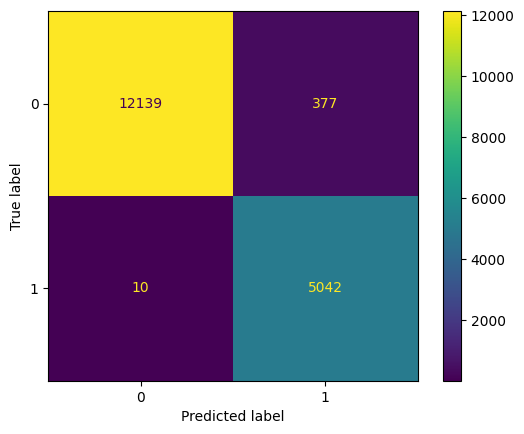

              precision    recall  f1-score   support

           0       1.00      0.97      0.98     12516
           1       0.93      1.00      0.96      5052

    accuracy                           0.98     17568
   macro avg       0.96      0.98      0.97     17568
weighted avg       0.98      0.98      0.98     17568

Results: test_accuracy: 0.9779713153839111, test_epoch_loss: 0.06508815264794127



In [ ]:
# kaggle
test_input_ids, test_attention_masks = tokenize_batch(test_df[test_df['source']=='kaggle']["text"])

y_test = torch.LongTensor(test_df[test_df['source']=='kaggle']['generated'].values)
test_model(model, test_input_ids, test_attention_masks,y_test, device, caption="kaggleset")

Testing model on mixset


100%|██████████| 1/1 [00:04<00:00,  4.79s/it]


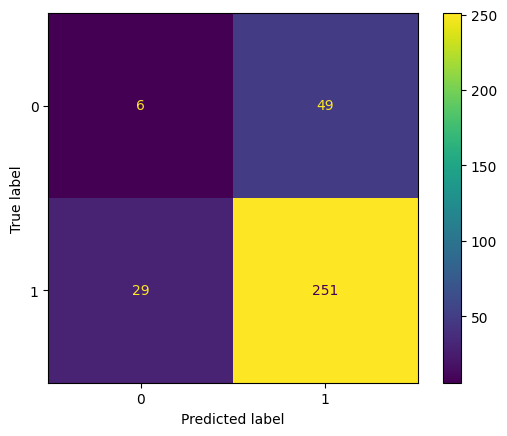

              precision    recall  f1-score   support

           0       0.17      0.11      0.13        55
           1       0.84      0.90      0.87       280

    accuracy                           0.77       335
   macro avg       0.50      0.50      0.50       335
weighted avg       0.73      0.77      0.75       335

Results: test_accuracy: 0.7671641707420349, test_epoch_loss: 0.6741575598716736



In [ ]:
# mixset
test_input_ids, test_attention_masks = tokenize_batch(test_df[test_df['source']=='mixset']["text"])

y_test = torch.LongTensor(test_df[test_df['source']=='mixset']['generated'].values)
test_model(model, test_input_ids, test_attention_masks,y_test, device, caption="mixset")

Testing model on mageset


100%|██████████| 34/34 [03:49<00:00,  6.74s/it]


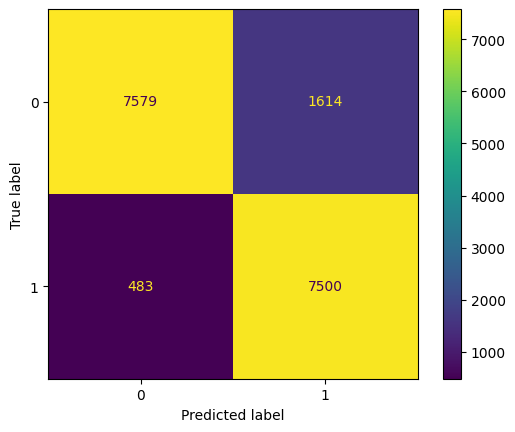

              precision    recall  f1-score   support

           0       0.94      0.82      0.88      9193
           1       0.82      0.94      0.88      7983

    accuracy                           0.88     17176
   macro avg       0.88      0.88      0.88     17176
weighted avg       0.89      0.88      0.88     17176

Results: test_accuracy: 0.8779110312461853, test_epoch_loss: 0.32335221249667445



In [ ]:
# magset
test_input_ids, test_attention_masks = tokenize_batch(test_df[test_df['source']=='mageset']["text"])

y_test = torch.LongTensor(test_df[test_df['source']=='mageset']['generated'].values)
test_model(model, test_input_ids, test_attention_masks,y_test, device, caption="mageset")

Testing model on raidset


100%|██████████| 23/23 [02:36<00:00,  6.80s/it]


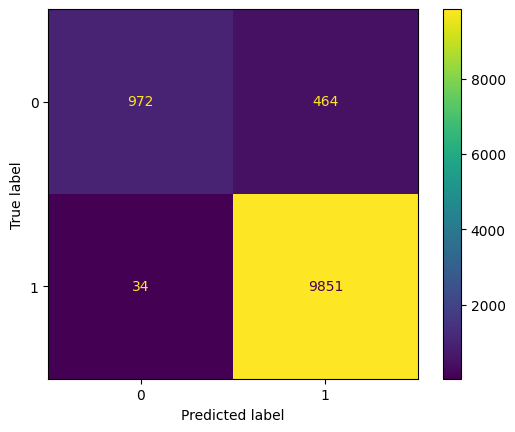

              precision    recall  f1-score   support

           0       0.97      0.68      0.80      1436
           1       0.96      1.00      0.98      9885

    accuracy                           0.96     11321
   macro avg       0.96      0.84      0.89     11321
weighted avg       0.96      0.96      0.95     11321

Results: test_accuracy: 0.9560109376907349, test_epoch_loss: 0.13529343968810953



In [ ]:
# raidset
test_input_ids, test_attention_masks = tokenize_batch(test_df[test_df['source']=='raid']["text"])

y_test = torch.LongTensor(test_df[test_df['source']=='raid']['generated'].values)
test_model(model, test_input_ids, test_attention_masks,y_test, device, caption="raidset")

Testing model on Full Test set


100%|██████████| 91/91 [10:36<00:00,  7.00s/it]


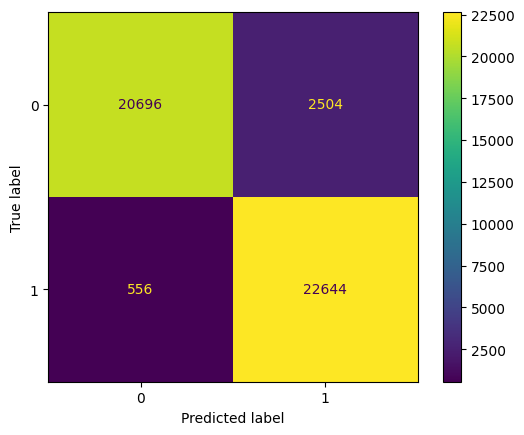

              precision    recall  f1-score   support

           0       0.97      0.89      0.93     23200
           1       0.90      0.98      0.94     23200

    accuracy                           0.93     46400
   macro avg       0.94      0.93      0.93     46400
weighted avg       0.94      0.93      0.93     46400

Results: test_accuracy: 0.9340517520904541, test_epoch_loss: 0.18221717906409296



In [ ]:
# whole testdataset
test_input_ids, test_attention_masks = tokenize_batch(test_df["text"])

y_test = torch.LongTensor(test_df['generated'].values)
test_model(model, test_input_ids, test_attention_masks,y_test, device, caption="Full Test set")

#### Testing with Custom texts

In [ ]:
human_text = """THE Conventions of a number of the States, having at the time of their adopting the Constitution, expressed a desire, in order to prevent misconstruction or abuse of its powers, that further declaratory and restrictive clauses should be added: And as extending the ground of public confidence in the Government, will best ensure the beneficent ends of its institution RESOLVED by the Senate and House of Representatives of the United States of America, in Congress assembled, two thirds of both Houses concurring, that the following Articles be proposed to the Legislatures of the several States, as amendments to the Constitution of the United States, all, or any of which Articles, when ratified by three fourths of the said Legislatures, to be valid to all intents and purposes, as part of the said Constitution; viz."""
refined_text = "Bolívar came from a wealthy, well-connected family—his father was a Venezuelan aristocrat with Spanish roots. But his childhood wasn't easy. He lost his father at three and his mother at nine, leaving his uncle to manage his inheritance and find him tutors. One of those tutors, Simón Rodríguez, left a lasting mark on him. Rodríguez was a devoted follower of Jean-Jacques Rousseau, and he opened Bolívar's eyes to the liberal ideas sweeping through 18th-century thought."
ai_text = "The rapid advancement of modern technology continues to reshape the way individuals interact with information, creating a dynamic environment where efficiency and accessibility are prioritized above all else. As organizations explore new opportunities for optimization, there is an increasing emphasis on integrating intelligent automated systems capable of analyzing patterns, generating insights, and supporting decision-making processes. This shift not only enhances productivity but also opens pathways for innovative solutions that adapt to evolving user needs in a highly interconnected digital ecosystem."
humanized_text = "Technology is changing fast, and it's completely transforming how we find and use information. Speed and ease of access have become the name of the game. Companies are jumping on this by bringing in smart automated tools that can spot patterns, pull out useful insights, and help people make better decisions. The result? People get more done, and there's room for creative solutions that can actually grow and change alongside what users need—all in a world that's more connected than ever."

In [ ]:
test_input_ids, test_attention_masks = tokenize_batch(pd.Series([human_text, refined_text, ai_text, humanized_text]))
y_test = torch.LongTensor([0, 1, 1,1])

In [ ]:
test_model(model, test_input_ids, test_attention_masks,y_test, device, caption="custom")

Testing model on custom


100%|██████████| 1/1 [00:00<00:00,  4.19it/s]

Results: test_accuracy: 1.0, test_epoch_loss: 0.19776299595832825 human_prob: tensor([[6.1553e-02, 9.3845e-01],
        [2.3467e-01, 7.6533e-01],
        [7.1290e-04, 9.9929e-01],
        [3.6831e-01, 6.3169e-01]], device='cuda:0')


##### Finetune - 2

In [ ]:
model = BERTModel()

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
# Load best saved model

states = torch.load("/content/drive/MyDrive/finetune_stage1_checkpoint_epoch_13.pth",
                    map_location="cuda")

device = torch.device("cuda")

# 2. Load model weights
model.load_state_dict(states["model"])

# 3. Create optimizer AFTER model is on CUDA
optimizer = torch.optim.AdamW([
    {
        'params': model.bert_model.bert.encoder.layer[7].parameters(),
        'lr': 0.5*3e-6,
        'weight_decay': 1e-5
    },
    # Layer 11 (except output) - 1e-5
    {
        'params': model.bert_model.bert.encoder.layer[8].parameters(),
        'lr': 0.5*3e-6,
        'weight_decay': 1e-5
    },
     {
        'params': model.bert_model.bert.encoder.layer[9].parameters(),
        'lr': 0.5*3e-6,
        'weight_decay': 1e-5
    },
    {
        'params': model.bert_model.bert.encoder.layer[10].parameters(),
        'lr': 0.5*5e-6,
        'weight_decay': 1e-5
    },
    {
        'params': model.bert_model.bert.encoder.layer[11].attention.parameters(),
        'lr': 0.5*1e-5,
        'weight_decay': 1e-5
    },
    {
        'params': model.bert_model.bert.encoder.layer[11].intermediate.parameters(),
        'lr': 0.5*1e-5,
        'weight_decay': 1e-5
    },
    # Layer 11 output - 2e-5
    {
        'params': model.bert_model.bert.encoder.layer[11].output.parameters(),
        'lr': 0.5*2e-5,
        'weight_decay': 1e-5
    },
    # Pooler - 2e-5
    {
        'params': model.bert_model.bert.pooler.parameters(),
        'lr': 0.5*2e-5,
        'weight_decay': 1e-5
    },
    # Classifier - 2e-5
    {
        'params': model.bert_model.classifier.parameters(),
        'lr': 0.5*4e-5,
        'weight_decay': 1e-5
    }
])



In [ ]:
# Unfreeze more layers


for p in model.parameters():
  p.requires_grad = False
for p in model.bert_model.bert.encoder.layer[7].parameters():
  p.requires_grad = True
for p in model.bert_model.bert.encoder.layer[8].parameters():
  p.requires_grad = True
for p in model.bert_model.bert.encoder.layer[9].parameters():
  p.requires_grad = True
for p in model.bert_model.bert.encoder.layer[10].parameters():
  p.requires_grad = True
for p in model.bert_model.bert.encoder.layer[11].parameters():
  p.requires_grad = True
for p in model.bert_model.bert.pooler.parameters():
  p.requires_grad = True
for p in model.bert_model.classifier.parameters():
  p.requires_grad = True

#### Convert inputs and true outputs to datasets

In [ ]:
train_input_ids, train_attention_masks = tokenize_batch(train_df["text"])
validation_input_ids, validation_attention_masks = tokenize_batch(valid_df["text"])
y_train = torch.LongTensor(train_df['generated'].values.astype(np.long))
y_val = torch.LongTensor(valid_df['generated'].values.astype(np.long))
train_dataset = TensorDataset(train_input_ids, train_attention_masks, y_train)
validation_dataset  = TensorDataset(validation_input_ids, validation_attention_masks, y_val)

##### Fine tune 2 : Stopped at Epoch 3

In [ ]:
model, optimizer, scheduler = train_model(model, train_dataset, validation_dataset,
                optimizer=optimizer, scheduler=None,
                start_epoch=0, epochs=4,
                best_accuracy=None,
                start_lr=3e-5,finetune_stage=2,
                device=torch.device("cuda"))

 Validation Epoch 0: 100%|██████████| 82/82 [01:46<00:00,  1.30s/it]


Epoch 0: Train Loss=0.0947 : Validation Loss=0.2362 : Best acc=0.0000 : LR=0.000002 : Train Accuracy=0.9620 : Validation Accuracy=0.9173
Checkpoint saved: /content/drive/MyDrive/finetune_stage2_checkpoint_epoch_0.pth


 Validation Epoch 1: 100%|██████████| 82/82 [01:47<00:00,  1.31s/it]


Epoch 1: Train Loss=0.0887 : Validation Loss=0.1877 : Best acc=0.9173 : LR=0.000002 : Train Accuracy=0.9647 : Validation Accuracy=0.9315
Checkpoint saved: /content/drive/MyDrive/finetune_stage2_checkpoint_epoch_1.pth


 Validation Epoch 2: 100%|██████████| 82/82 [01:47<00:00,  1.31s/it]


Epoch 2: Train Loss=0.0840 : Validation Loss=0.2066 : Best acc=0.9315 : LR=0.000002 : Train Accuracy=0.9665 : Validation Accuracy=0.9273
Checkpoint saved: /content/drive/MyDrive/finetune_stage2_checkpoint_epoch_2.pth


 Validation Epoch 3: 100%|██████████| 82/82 [01:47<00:00,  1.31s/it]


Epoch 3: Train Loss=0.0805 : Validation Loss=0.2021 : Best acc=0.9315 : LR=0.000002 : Train Accuracy=0.9678 : Validation Accuracy=0.9291
Checkpoint saved: /content/drive/MyDrive/finetune_stage2_checkpoint_epoch_3.pth


#### Test on finetuned model -  2

In [ ]:
model = BERTModel()

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
# Load best model
states = torch.load("/content/drive/MyDrive/finetune_stage2_checkpoint_epoch_1.pth",
                    map_location="cuda")

device = torch.device("cuda")

model.load_state_dict(states["model"])

<All keys matched successfully>

### Tester: validate on test set

In [ ]:
def test_datasets(model, test_df):
  # kaggle
  test_input_ids, test_attention_masks = tokenize_batch(test_df[test_df['source']=='kaggle']["text"])

  y_test = torch.LongTensor(test_df[test_df['source']=='kaggle']['generated'].values)
  test_model(model, test_input_ids, test_attention_masks,y_test, device, caption="kaggleset")

  # mixset
  test_input_ids, test_attention_masks = tokenize_batch(test_df[test_df['source']=='mixset']["text"])

  y_test = torch.LongTensor(test_df[test_df['source']=='mixset']['generated'].values)
  test_model(model, test_input_ids, test_attention_masks,y_test, device, caption="mixset")


  # magset
  test_input_ids, test_attention_masks = tokenize_batch(test_df[test_df['source']=='mageset']["text"])

  y_test = torch.LongTensor(test_df[test_df['source']=='mageset']['generated'].values)
  test_model(model, test_input_ids, test_attention_masks,y_test, device, caption="mageset")


  # raidset
  test_input_ids, test_attention_masks = tokenize_batch(test_df[test_df['source']=='raid']["text"])

  y_test = torch.LongTensor(test_df[test_df['source']=='raid']['generated'].values)
  test_model(model, test_input_ids, test_attention_masks,y_test, device, caption="raidset")

  # Full testset
  test_input_ids, test_attention_masks = tokenize_batch(test_df["text"])

  y_test = torch.LongTensor(test_df['generated'].values)
  test_model(model, test_input_ids, test_attention_masks,y_test, device, caption="full-test-set")


Testing model on kaggleset


100%|██████████| 35/35 [00:45<00:00,  1.29s/it]


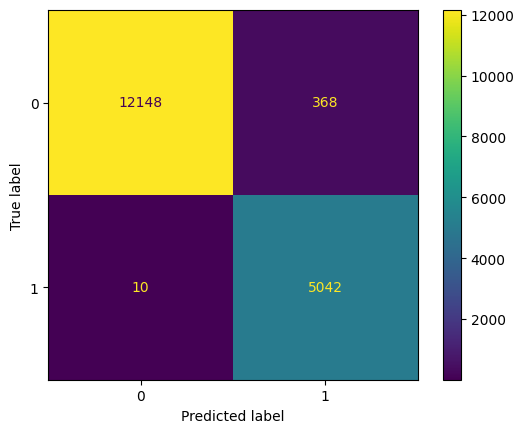

              precision    recall  f1-score   support

           0       1.00      0.97      0.98     12516
           1       0.93      1.00      0.96      5052

    accuracy                           0.98     17568
   macro avg       0.97      0.98      0.97     17568
weighted avg       0.98      0.98      0.98     17568

Results: test_accuracy: 0.9784836173057556, test_epoch_loss: 0.061902630205634294

Testing model on mixset


100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


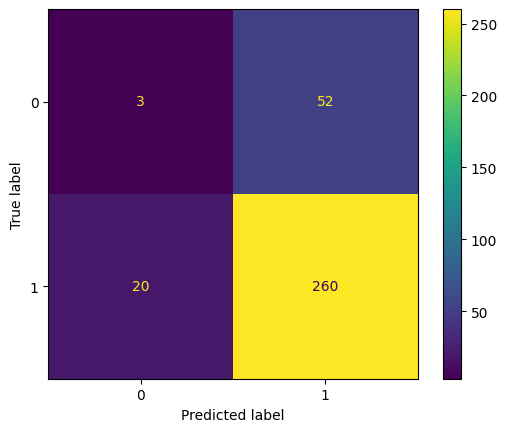

              precision    recall  f1-score   support

           0       0.13      0.05      0.08        55
           1       0.83      0.93      0.88       280

    accuracy                           0.79       335
   macro avg       0.48      0.49      0.48       335
weighted avg       0.72      0.79      0.75       335

Results: test_accuracy: 0.7850746512413025, test_epoch_loss: 0.6585220098495483

Testing model on mageset


100%|██████████| 34/34 [00:44<00:00,  1.30s/it]


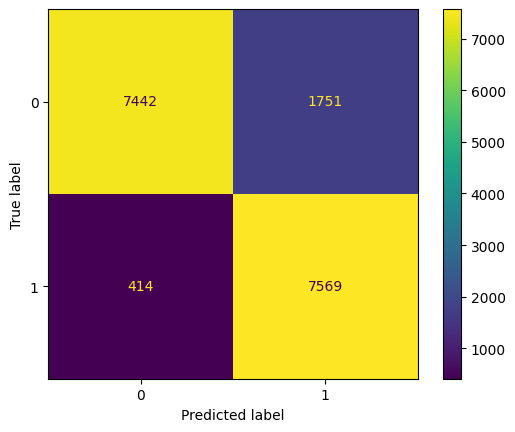

              precision    recall  f1-score   support

           0       0.95      0.81      0.87      9193
           1       0.81      0.95      0.87      7983

    accuracy                           0.87     17176
   macro avg       0.88      0.88      0.87     17176
weighted avg       0.88      0.87      0.87     17176

Results: test_accuracy: 0.8739520311355591, test_epoch_loss: 0.3332796081810371

Testing model on raidset


100%|██████████| 23/23 [00:29<00:00,  1.27s/it]


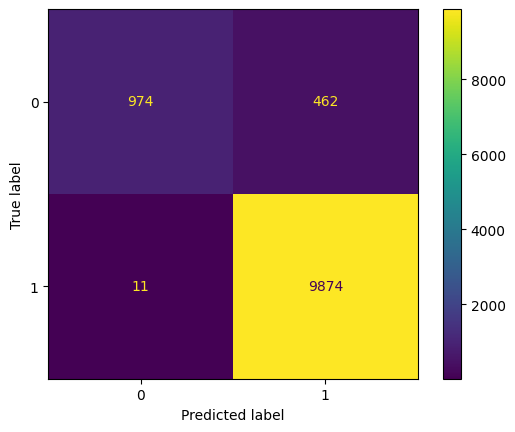

              precision    recall  f1-score   support

           0       0.99      0.68      0.80      1436
           1       0.96      1.00      0.98      9885

    accuracy                           0.96     11321
   macro avg       0.97      0.84      0.89     11321
weighted avg       0.96      0.96      0.95     11321

Results: test_accuracy: 0.9582192301750183, test_epoch_loss: 0.1317924999931962

Testing model on full-test-set


100%|██████████| 91/91 [01:59<00:00,  1.31s/it]


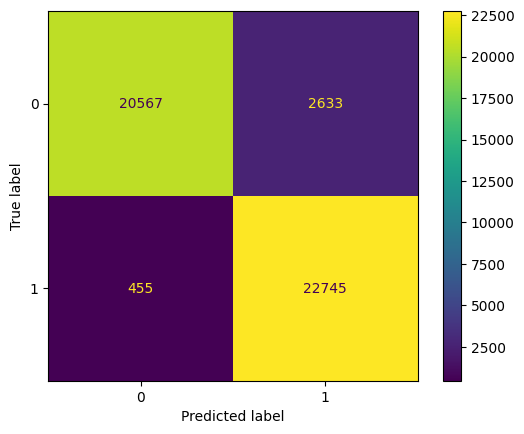

              precision    recall  f1-score   support

           0       0.98      0.89      0.93     23200
           1       0.90      0.98      0.94     23200

    accuracy                           0.93     46400
   macro avg       0.94      0.93      0.93     46400
weighted avg       0.94      0.93      0.93     46400

Results: test_accuracy: 0.933448314666748, test_epoch_loss: 0.1837186150920802



In [ ]:
test_datasets(model, test_df)

## Model Evaluation

In [ ]:
# imports
from transformers import BertForSequenceClassification
import torch
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
from tqdm import tqdm
from transformers import AutoTokenizer
import matplotlib.pyplot as plt

### Load test data

In [ ]:
df = pd.read_csv('standardized_df_v2.csv')


train_df, test_df = train_test_split(df, test_size=0.1, stratify=df['generated'], random_state=101)
train_df, valid_df = train_test_split(train_df, test_size=0.1, stratify=train_df['generated'], random_state=101)

/tmp/ipython-input-3542333350.py:1: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/content/drive/MyDrive/standardized_df_v2.csv')


### Load Tokenizer

In [ ]:
tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")

def tokenize_text(text_list):
  encoded = tokenizer(
        text_list,
        padding='max_length',
        truncation=True,
        max_length=256,
        return_tensors="pt"
    )
  return encoded["input_ids"], encoded["attention_mask"]


### Load model

In [ ]:
def load_bert_ai_text_detector():
  class BERTModel(torch.nn.Module):

    def __init__(self):
      super().__init__()
      self.bert_model = BertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=2)

    def forward(self, input_ids, attention_mask):
      out =  self.bert_model(input_ids=input_ids, attention_mask=attention_mask)
      return out.logits

  model = BERTModel()
  # Load best model
  states = torch.load("/content/drive/MyDrive/finetune_stage2_checkpoint_epoch_1.pth",
                      map_location="cpu")

  device = torch.device("cpu")

  model.load_state_dict(states["model"])
  return model

### Tester

In [ ]:
def test_model(model, text, label):
  test_input_ids, test_attention_masks = tokenize_text([text])
  criterion = torch.nn.CrossEntropyLoss()

  with torch.no_grad():
      y_preds = model(test_input_ids, test_attention_masks)
      probs = torch.softmax(y_preds, dim=1)
      predictions = torch.argmax(probs, dim=1)
      loss = criterion(y_preds, torch.LongTensor([label]))
      expected = ''
      if label==0:
        expected = 'Human Text'
      elif label==0.5:
        expected = 'Uncertain'
      else:
        expected = 'AI Text'
      res = {"confidence": {"Human Text": float(probs.numpy()[0][0]), "AI Text": float(probs.numpy()[0][1])},
             "expected": expected,
                   "prediction": 'Human Text' if predictions.numpy()[0]==0 else 'AI Text',
                   "loss": loss.item()}
      return res

### Load best perfroming model

In [ ]:
bert_model = load_bert_ai_text_detector()

### Model certainity test on Human Text

In [ ]:
human_text = test_df[test_df['generated']==0].sample(1, random_state=2)
print("Datapoint source:", human_text['source'].values[0])
prompt = human_text['text'].values[0]
print("Length of the prompt:", len(prompt), "characters\n\nPrompt:")
prompt

Datapoint source: kaggle
Length of the prompt: 2009 characters

Prompt:


'Dear Mr. Senator,\n\nThe way the voting IJ now in the United State need to be changed. It should change from Electoral College to popular vote. The voting system IJ an all or nothing system which mean lot of people vote would not count for the president they want. If the voting system change the president would actually be picked by the people and not by a group of people who won the popular vote.\n\nThe electoral college IJ unfair to many people because their vote goes to waste if the other late of electors won. In Source 2 it Jay "On the off chance that those electors win the statewide election, they would go to Congress and... would get... electoral vote." That IJ saying that part of the vote would not count because the other group won and not the one they wanted to win. So then the president will get a certain number of electoral vote based on the population of that state. Some people feel like their vote are not needed AJ much because if the majority of that state chose the other

In [ ]:
print("BERT AI text detector results: ", test_model(bert_model, prompt, 0))

BERT AI text detector results:  {'confidence': {'Human Text': 0.9998947381973267, 'AI Text': 0.0001052820953191258}, 'expected': 'Human Text', 'prediction': 'Human Text', 'loss': 0.00010525626566959545}


### Model certainity test on AI Text

In [ ]:
human_text = test_df[test_df['generated']==1].sample(1, random_state=16)
print("Datapoint source:", human_text['source'].values[0])
prompt = human_text['text'].values[0]
print("Length of the prompt:", len(prompt), "characters\n\nPrompt:")
prompt

Datapoint source: mageset
Length of the prompt: 291 characters

Prompt:


"It's generally a good idea to look at CPU benchmarks rather than just the clock speed, because the amount of work a CPU can do per clock cycle varies a lot between devices. Good point, I guess that day it will most likely be one of those old 3-4 cores CPUs that are not as fast as newer ones"

In [ ]:
print("BERT AI text detector results: ", test_model(bert_model, prompt, 1))

BERT AI text detector results:  {'confidence': {'Human Text': 0.013788203708827496, 'AI Text': 0.9862117767333984}, 'expected': 'AI Text', 'prediction': 'AI Text', 'loss': 0.01388415228575468}



### Model uncertainity test on Human + AI normal text + Human text

In [ ]:
human_text1 = test_df[test_df['generated']==0].sample(1, random_state=102)
print("Datapoint source for human_text1:", human_text1['source'].values[0])
human_text2 = test_df[test_df['generated']==0].sample(1, random_state=103)
print("Datapoint source for human_text2:", human_text2['source'].values[0])
ai_normal_text = test_df[test_df['generated']==1].sample(1, random_state=101)
print("Datapoint source for ai_normal_text:", ai_normal_text['source'].values[0])

prompt = human_text1['text'].values[0].split('.')[0] + " " + ai_normal_text['text'].values[0].split('.')[0] + " " + human_text2['text'].values[0].split('.')[0]
print(f"Length of human sentence 1: {len(human_text1['text'].values[0].split('.')[0])}, Length of ai sentence: {len(ai_normal_text['text'].values[0].split('.')[0])}, Length of human sentence 2: {len(human_text2['text'].values[0].split('.')[0])}")
print("Length of the prompt:", len(prompt), "characters\n\nPrompt:")
prompt

Datapoint source for human_text1: kaggle
Datapoint source for human_text2: mageset
Datapoint source for ai_normal_text: kaggle
Length of human sentence 1: 61, Length of ai sentence: 68, Length of human sentence 2: 182
Length of the prompt: 313 characters

Prompt:


'I am arguing to change the ways of the Electoral College vote In the developed world, the car has long been a staple of daily life Bielik, 17, who underwent his medical at Arsenal last week, signed for Legia from their Polish rivals Lech Poznan in July and has made six appearances in all competitions this season'

In [ ]:
print("BERT AI text detector results: ", test_model(bert_model, prompt, 0.5))

BERT AI text detector results:  {'confidence': {'Human Text': 0.05153569206595421, 'AI Text': 0.9484642744064331}, 'expected': 'Uncertain', 'prediction': 'AI Text', 'loss': 2.9654805660247803}


###  Model uncertainity test on AI normal text + Human text + AI normal text

In [ ]:
ai_normal_text1 = test_df[test_df['generated']==1].sample(1, random_state=103)
print("Datapoint source for ai_normal_text1:", ai_normal_text1['source'].values[0])
ai_normal_text2 = test_df[test_df['generated']==1].sample(1, random_state=107)
print("Datapoint source for ai_normal_text2:", ai_normal_text2['source'].values[0])
human_text = test_df[test_df['generated']==0].sample(1, random_state=78)
print("Datapoint source for human_text:", human_text['source'].values[0])

prompt = ai_normal_text1['text'].values[0] + " " + human_text['text'].values[0] + " " + ai_normal_text2['text'].values[0]
print("Length of the prompt:", len(prompt), "characters\n\nPrompt:")
prompt

Datapoint source for ai_normal_text1: kaggle
Datapoint source for ai_normal_text2: kaggle
Datapoint source for human_text: kaggle
Length of the prompt: 6203 characters

Prompt:


'First impressions are the initial opinions or judgments we form about someone or something. They are often based on our first encounter with a person or situation and can be influenced by a variety of actors such as physical appearance, behavior, and personality. However, first impressions are not always accurate and can change over time.\n\nOne reason first impressions can change is due to new information or experiences that challenge our initial perceptions. For example, iv we meet someone who is initially perceived as rude or unfriendly, but Mater Main that they are going through a difficult time in their Five, our first impression of them may change to be more sympathetic. Similarly, iv we initially judge a situation based on Limited information, but Mater gain a better understanding of the context, our first impression may change.\n\nAnother reason first impressions can change is due to the influence of cultural or societal norms. For example, what may be considered rude or impol

In [ ]:
print("BERT AI text detector results: ",test_model(bert_model, prompt, 0.5))

BERT AI text detector results:  {'confidence': {'Human Text': 2.5535080567351542e-05, 'AI Text': 0.9999744892120361}, 'expected': 'Uncertain', 'prediction': 'AI Text', 'loss': 10.575457572937012}


### Custom Prompt where we start with human text and blend in AI text, where AI Text becomes the majority

In [ ]:
prompt = "I have been thinking about getting a new laptop you know? My old one is suuper slow and the battery dies fast! After researching various options, I found that modern laptops offer significant improvements. The latest models feature enhanced processing capabilities and improved battery efficiency. Furthermore, advancements in display technology provide superior visual experiences."
print("Length of the prompt:", len(prompt), "characters\n\nPrompt:")
prompt

Length of the prompt: 382 characters

Prompt:


'I have been thinking about getting a new laptop you know? My old one is suuper slow and the battery dies fast! After researching various options, I found that modern laptops offer significant improvements. The latest models feature enhanced processing capabilities and improved battery efficiency. Furthermore, advancements in display technology provide superior visual experiences.'

In [ ]:
print("BERT AI text detector results: ",test_model(bert_model, prompt, 0.5))

BERT AI text detector results:  {'confidence': {'Human Text': 6.0463087720563635e-05, 'AI Text': 0.9999395608901978}, 'expected': 'Uncertain', 'prediction': 'AI Text', 'loss': 9.71347713470459}


### Alternating AI and Human Text

In [ ]:
ai_normal_text1 = test_df[test_df['generated']==1].sample(1, random_state=103)
print("Datapoint source for ai_normal_text1:", ai_normal_text1['source'].values[0])
ai_normal_text2 = test_df[test_df['generated']==1].sample(1, random_state=107)
print("Datapoint source for ai_normal_text2:", ai_normal_text2['source'].values[0])
human_text = test_df[test_df['generated']==0].sample(1, random_state=78)
print("Datapoint source for human_text:", human_text['source'].values[0])

prompt = ai_normal_text1['text'].values[0].split('.')[0] + " " + human_text['text'].values[0].split('.')[0] + " " + ai_normal_text2['text'].values[0].split('.')[0]
print("Length of the prompt:", len(prompt), "characters\n\nPrompt:")
prompt

Datapoint source for ai_normal_text1: kaggle
Datapoint source for ai_normal_text2: kaggle
Datapoint source for human_text: kaggle
Length of the prompt: 401 characters

Prompt:


'First impressions are the initial opinions or judgments we form about someone or something Some reasons the face is a natural landform is, there was a close up picture taken of it in 200,After the image was civilized it was proven that there were no buildings around or in the face Introduction:\n Driverless cars, a technology that was once considered a luxury of the future, is now becoming a reality'

In [ ]:
print("BERT AI text detector results: ",test_model(bert_model, prompt, 0.5))

BERT AI text detector results:  {'confidence': {'Human Text': 0.08390472084283829, 'AI Text': 0.9160953164100647}, 'expected': 'Uncertain', 'prediction': 'AI Text', 'loss': 2.4780733585357666}


### Text length vs Model Confidence on Human Text

In [ ]:

human_text = test_df[test_df['generated']==0].sample(1, random_state=17)
print("Datapoint source for human_text:", human_text['source'].values[0])

ai_confidence = []
human_confidence = []
print("Prompt total_length: ", len(human_text['text'].values[0]))
loader = tqdm.tqdm(range(len(human_text['text'].values[0])))
for i,j in enumerate(loader):
  prompt = human_text['text'].values[0][0:i]
  result = test_model(bert_model, prompt, 1)
  ai_confidence.append(result['confidence']['AI Text'])
  human_confidence.append(result['confidence']['Human Text'])


Datapoint source for human_text: kaggle
Prompt total_length:  1028


100%|██████████| 1028/1028 [16:03<00:00,  1.07it/s]


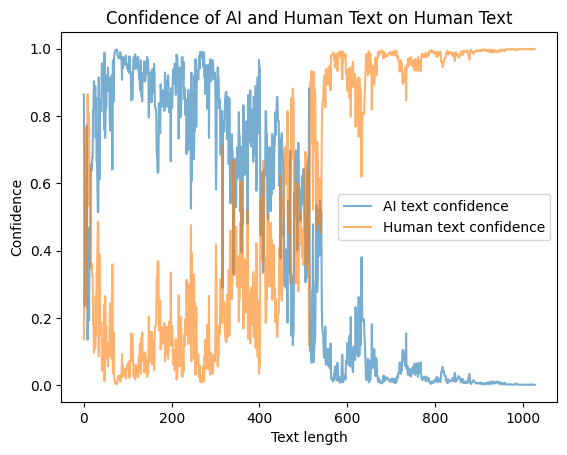

In [ ]:
plt.plot(range(len(human_text['text'].values[0])), ai_confidence, label='AI text confidence', alpha=0.6)
plt.plot(range(len(human_text['text'].values[0])), human_confidence, label='Human text confidence', alpha=0.6)
plt.xlabel('Text length')
plt.ylabel('Confidence')
plt.title('Confidence of AI and Human Text on Human Text')
plt.legend()
plt.show()

### Text length vs Mean Confidence on Human Text

In [ ]:

human_text = test_df[test_df['generated']==0].sample(10, random_state=17)
print("Datapoint source for human_text:", human_text['source'].values)

ai_confidence = []
human_confidence = []
loader = tqdm(range(len(human_text['source'].values)))
for i,j in enumerate(loader):
  if len(ai_confidence)<=i:
    ai_confidence.append([])
    human_confidence.append([])
  print(f"Prompt {i+1} total_length: ", len(human_text['text'].values[i]))
  for k in range(1,11):
    prompt = human_text['text'].values[i][0:k*100]
    result = test_model(bert_model, prompt, 1)
    ai_confidence[i].append(result['confidence']['AI Text'])
    human_confidence[i].append(result['confidence']['Human Text'])


Datapoint source for human_text: ['kaggle' 'mageset' 'kaggle' 'mageset' 'kaggle' 'mageset' 'mageset'
 'kaggle' 'mageset' 'kaggle']


  0%|          | 0/10 [00:00<?, ?it/s]

Prompt 1 total_length:  1028


 10%|█         | 1/10 [00:09<01:28,  9.84s/it]

Prompt 2 total_length:  1071


 20%|██        | 2/10 [00:25<01:43, 12.99s/it]

Prompt 3 total_length:  1110


 30%|███       | 3/10 [00:34<01:20, 11.55s/it]

Prompt 4 total_length:  3447


 40%|████      | 4/10 [00:43<01:01, 10.28s/it]

Prompt 5 total_length:  4009


 50%|█████     | 5/10 [00:53<00:50, 10.11s/it]

Prompt 6 total_length:  1048


 60%|██████    | 6/10 [01:02<00:39,  9.98s/it]

Prompt 7 total_length:  193


 70%|███████   | 7/10 [01:10<00:28,  9.41s/it]

Prompt 8 total_length:  3811


 80%|████████  | 8/10 [01:20<00:19,  9.51s/it]

Prompt 9 total_length:  1271


 90%|█████████ | 9/10 [01:30<00:09,  9.59s/it]

Prompt 10 total_length:  1511


100%|██████████| 10/10 [01:38<00:00,  9.88s/it]


In [ ]:
ai_confidence_mean = np.array(ai_confidence).mean(axis=0)
human_confidence_mean = np.array(human_confidence).mean(axis=0)

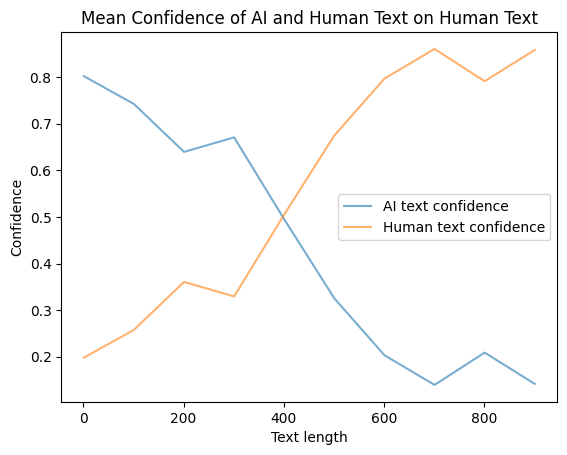

In [ ]:
plt.plot(range(1,1001, 100), ai_confidence_mean, label='AI text confidence', alpha=0.6)
plt.plot(range(1,1001, 100), human_confidence_mean, label='Human text confidence', alpha=0.6)
plt.xlabel('Text length')
plt.ylabel('Confidence')
plt.title('Mean Confidence of AI and Human Text on Human Text')
plt.legend()
plt.show()

### Text length vs Model Confidence on AI Text

In [ ]:

ai_text = test_df[test_df['generated']==1].sample(1, random_state=98)
print("Datapoint source for ai_text:", ai_text['source'].values[0])

ai_confidence = []
human_confidence = []
print("Prompt total_length: ", len(ai_text['text'].values[0]))
loader = tqdm.tqdm(range(len(ai_text['text'].values[0])))
for i,j in enumerate(loader):
  prompt = ai_text['text'].values[0][0:i]
  result = test_model(bert_model, prompt, 1)
  ai_confidence.append(result['confidence']['AI Text'])
  human_confidence.append(result['confidence']['Human Text'])


Datapoint source for ai_text: raid
Prompt total_length:  817


100%|██████████| 817/817 [12:10<00:00,  1.12it/s]


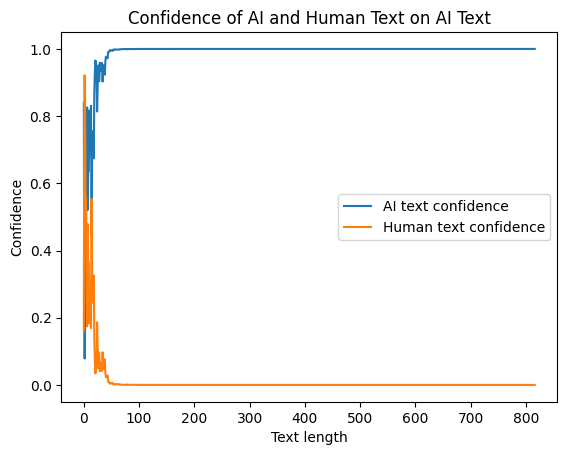

In [ ]:
plt.plot(range(len(ai_text['text'].values[0])), ai_confidence, label='AI text confidence')
plt.plot(range(len(ai_text['text'].values[0])), human_confidence, label='Human text confidence')
plt.xlabel('Text length')
plt.ylabel('Confidence')
plt.title('Confidence of AI and Human Text on AI Text')
plt.legend()
plt.show()

### Text length vs Mean Confidence on AI Text

In [ ]:

ai_text = test_df[test_df['generated']==1].sample(10, random_state=98)
print("Datapoint source for human_text:", ai_text['source'].values)

ai_confidence = []
human_confidence = []
loader = tqdm(range(len(ai_text['source'].values)))
for i,j in enumerate(loader):
  if len(ai_confidence)<=i:
    ai_confidence.append([])
    human_confidence.append([])
  print(f"Prompt {i+1} total_length: ", len(ai_text['text'].values[i]))
  for k in range(1,11):
    prompt = ai_text['text'].values[i][0:k*100]
    result = test_model(bert_model, prompt, 1)
    ai_confidence[i].append(result['confidence']['AI Text'])
    human_confidence[i].append(result['confidence']['Human Text'])


Datapoint source for human_text: ['raid' 'kaggle' 'mageset' 'mageset' 'kaggle' 'mageset' 'mageset' 'raid'
 'raid' 'mageset']


  0%|          | 0/10 [00:00<?, ?it/s]

Prompt 1 total_length:  817


 10%|█         | 1/10 [00:15<02:22, 15.87s/it]

Prompt 2 total_length:  3494


 20%|██        | 2/10 [00:25<01:37, 12.22s/it]

Prompt 3 total_length:  283


 30%|███       | 3/10 [00:34<01:14, 10.62s/it]

Prompt 4 total_length:  204


 40%|████      | 4/10 [00:43<01:00, 10.08s/it]

Prompt 5 total_length:  1733


 50%|█████     | 5/10 [00:53<00:49,  9.95s/it]

Prompt 6 total_length:  5282


 60%|██████    | 6/10 [01:01<00:38,  9.51s/it]

Prompt 7 total_length:  5150


 70%|███████   | 7/10 [01:11<00:28,  9.45s/it]

Prompt 8 total_length:  2119


 80%|████████  | 8/10 [01:21<00:19,  9.57s/it]

Prompt 9 total_length:  984


 90%|█████████ | 9/10 [01:29<00:09,  9.32s/it]

Prompt 10 total_length:  2713


100%|██████████| 10/10 [01:39<00:00,  9.91s/it]


In [ ]:
ai_confidence_mean = np.array(ai_confidence).mean(axis=0)
human_confidence_mean = np.array(human_confidence).mean(axis=0)

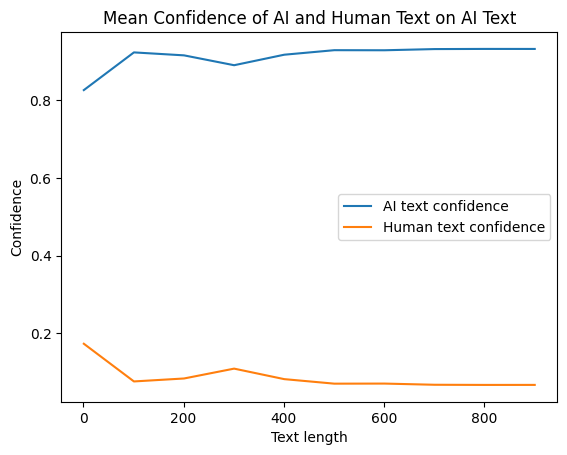

In [ ]:
plt.plot(range(1,1001, 100), ai_confidence_mean, label='AI text confidence')
plt.plot(range(1,1001, 100), human_confidence_mean, label='Human text confidence')
plt.xlabel('Text length')
plt.ylabel('Confidence')
plt.title('Mean Confidence of AI and Human Text on AI Text')
plt.legend()
plt.show()